# Modelo de Regresión para Series de Tiempo con Imágenes


#### Este trabajo surge como el estudio previo a la creación del modelo final de mi **TFG**.

#### Mi **TFG** consiste en desarrollar un modelo **Imitation Learning** o **Behavior Cloninig** apoyado con **Dagger** dentro de un videojuego

####  **Imitation Learning** o **Behavior Cloninig** consiste en un conjunto de técnicas relacionadas con Reinforcement Learning, donde mediante muestras de un experto un humano, la inteligencia artificial aprende a realizar una acción.

#### En el caso de mi TFG, se trataba de enseñar a una inteligencia artificial a jugar de forma autónoma a un videojuego.

#### Para esto, al entrenar el modelo, necesité utilizar series de tiempo, ya que mi dataset estaba compuesto por:


*   5 imágenes en formato de frames del mapa.
*   5 imágenes en formato de frames de lo que veía el jugador.
*   Una lista que representa el movimiento del personaje con el ratón.

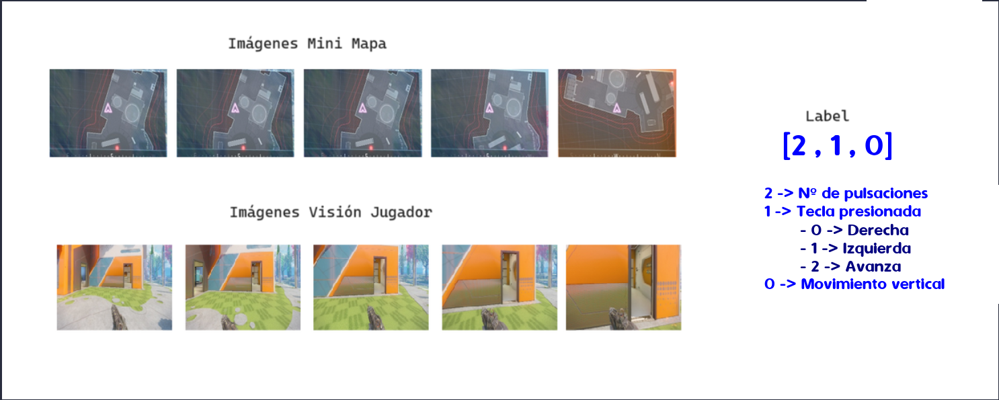

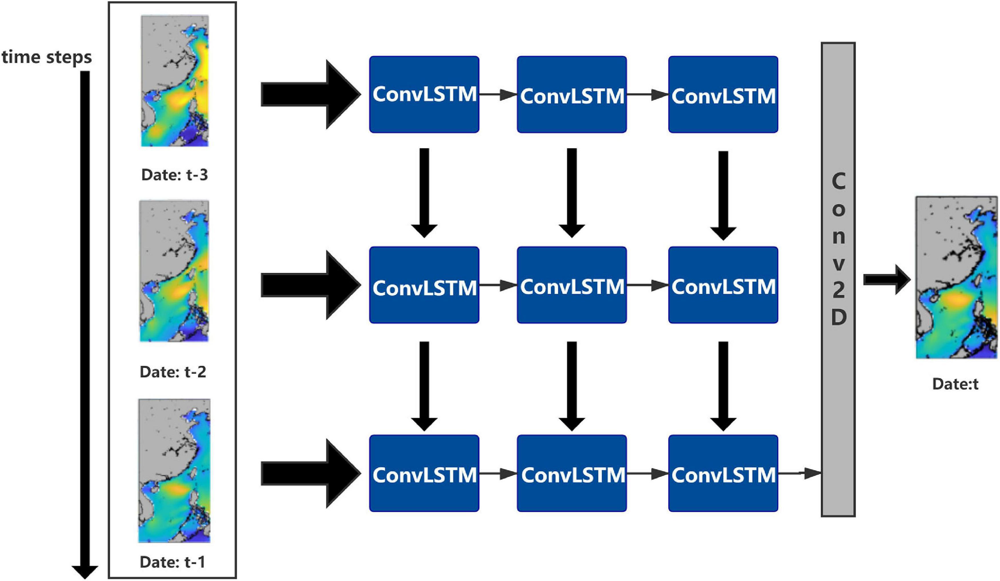

# Resumen del Notebook
#### Para ello, después de recolectar suficientes muestras para crear el modelo, comencé su desarrollo.

#### En este notebook se lleva a cabo:


*   Estudio del Conjunto de Datos
*   Preprocesamiento tanto de las imágenes como de la variable a predecir
*   Preprocesamiento con herramientas como MinMaxScaler o estructuras de normalización
*   Creación de una estructura de batches personalizada para este problema
*   Creacion de modelo de Serie de Tiempo
*   Optimización del modelo
*   Estudio de los resultados Obtenidos

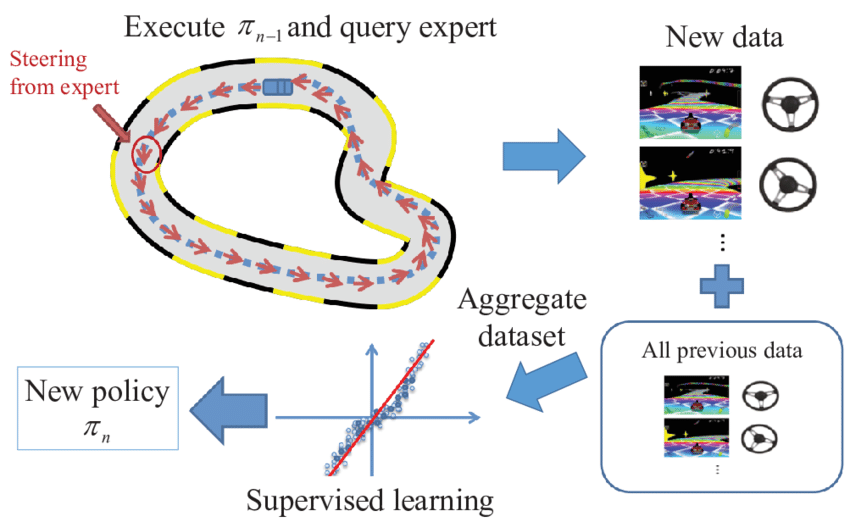

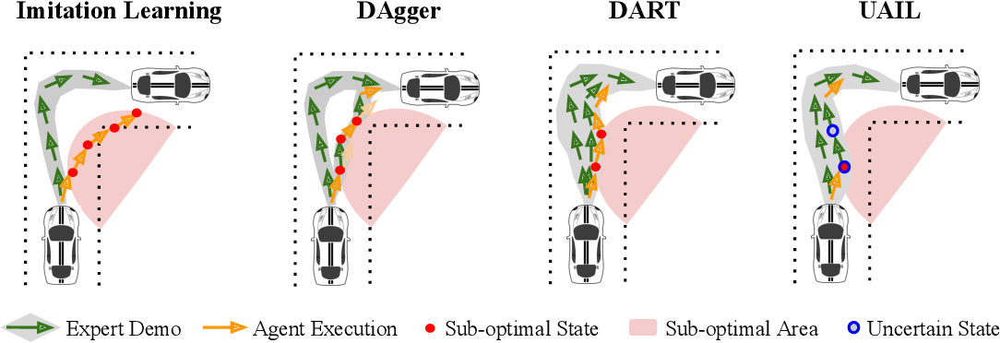

In [1]:
import tensorflow as tf
import logging
# Ajusta el nivel de logs a ERROR para ocultar warnings y otros mensajes menos críticos
tf.get_logger().setLevel(logging.ERROR)

# Verificar dispositivos disponibles
if tf.test.gpu_device_name():
    print('GPU encontrada:', tf.test.gpu_device_name())
else:
    print("No se encontró GPU. Se utilizará la CPU.")

# Listar todas las GPU disponibles
gpus = tf.config.experimental.list_physical_devices('GPU')

# Configurar el crecimiento de memoria para cada GPU
if gpus:
    for gpu in gpus:
        print("Activada la asignacion de memoria gradual")
        tf.config.experimental.set_memory_growth(gpu, True)

2024-11-23 22:55:53.480877: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-23 22:55:53.488566: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-23 22:55:53.497418: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-23 22:55:53.500030: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-23 22:55:53.506824: I tensorflow/core/platform/cpu_feature_guar

GPU encontrada: /device:GPU:0
Activada la asignacion de memoria gradual


I0000 00:00:1732398954.481352   11953 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732398954.506809   11953 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732398954.506970   11953 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732398954.563325   11953 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

In [10]:
import numpy as np
import math
import cv2
from PIL import Image, ImageEnhance ,ImageFilter
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import os
#os.environ['TF_GPU_ALLOCATOR'] = 'cuda_malloc_async'

In [11]:
import sqlite3
import shutil
import pandas as pd

 # Comprobar si el archivo existe
if not os.path.exists('../datos/grabacion/base_datos_cod_augmented.db'):
    # Copiar el archivo
    shutil.copy('../datos/grabacion/base_datos_cod.db', '../datos/grabacion/base_datos_cod_augmented.db')
    print("Archivo copiado exitosamente..")
else:
    print("Archivo ya existe..")

# Conectar a la base de datos (crea el archivo si no existe)
conexion = sqlite3.connect("../datos/grabacion/base_datos_cod_augmented.db")

# Crear un cursor para interactuar con la base de datos
cursor = conexion.cursor()

Archivo copiado exitosamente..


In [12]:
cursor.execute("SELECT MAX(id) FROM videos_mapa")
ID = cursor.fetchone()[0]

if ID == None:
    ID = 0

ID

1875

### Obtenemos todos los ids donde haya mas de 5 videos

In [13]:
CANTIDAD_VIDEOS = 5

cursor.execute("SELECT id as id_video, COUNT(*) AS cantidad FROM videos_mapa GROUP BY id HAVING COUNT(*) > "+str(CANTIDAD_VIDEOS)+"")
resultados = cursor.fetchall()

# Obtener los nombres de las columnas
columnas = [descripcion[0] for descripcion in cursor.description]

# Crear el DataFrame
df_ids = pd.DataFrame(resultados, columns=columnas)

# Utilizando .to_numpy()
ARRAY_ID = df_ids['id_video'].to_numpy()

In [14]:
ARRAY_ID

array([   0,    1,    2,    6,    7,    8,   10,   12,   14,   15,   16,
         17,   18,   19,   20,   21,   22,   23,   26,   28,   31,   32,
         33,   34,   35,   36,   39,   40,   43,   44,   51,   52,   53,
         55,   56,   58,   60,   63,   64,   66,   68,   71,   72,   74,
         75,   76,   78,   79,   80,   81,   82,   84,   87,   88,   90,
         92,   93,   94,   97,   98,   99,  102,  104,  105,  106,  108,
        109,  110,  111,  114,  115,  118,  121,  122,  123,  126,  127,
        128,  131,  134,  138,  139,  140,  141,  142,  143,  144,  146,
        149,  150,  152,  153,  154,  155,  157,  158,  159,  164,  167,
        168,  169,  170,  172,  174,  176,  177,  182,  184,  186,  187,
        189,  191,  192,  193,  196,  197,  198,  199,  201,  202,  203,
        204,  205,  206,  207,  208,  209,  210,  213,  215,  217,  218,
        219,  220,  221,  224,  225,  226,  227,  230,  231,  233,  234,
        235,  236,  237,  238,  243,  244,  245,  2

## DATA AUGMENTATION (IGNORAR SI YA SE APLICO)

In [15]:
def crear_recompensa(df):

        # Crear la columna 'reward' si no existe
    if 'reward' not in df.columns:
        df['reward'] = 0  # Inicializar con un valor predeterminado

    for index, row in df.iterrows(): 
        indice_img = 0       
        df_row = {}
        menor_valor = 300
        for col in df.columns:
            if col not in ["etiqueta", "orden", "id","reward"]:
                # Obtener la ruta de la imagen
                imagen = Image.open("../" + row[col])
                distancia = transformar_imagen(imagen)

                if distancia < menor_valor:
                    menor_valor = distancia
            elif col == "orden" or col == "etiqueta":
                df_row[col] = row[col]
        
        # Asignar el menor valor encontrado a la columna 'reward' de la fila actual
        df.at[index, 'reward'] = menor_valor
    
    return df

def mostrar_mascara(imagen,ancho_img, alto_img):
    # Convertir la imagen a espacio de color HSV
    hsv = cv2.cvtColor(imagen, cv2.COLOR_BGR2HSV)

    # Visualizar la imagen original
    #plt.imshow(cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB))
    #plt.title("Imagen Original")
    #plt.axis('off')
    #plt.show()

    # Definir el color rgba(224, 131, 126) y convertirlo a HSV
    rgba = np.array([224, 131, 126], dtype=np.uint8)  # Color en RGB
    color_hsv = cv2.cvtColor(np.reshape(rgba, (1, 1, 3)), cv2.COLOR_RGB2HSV)
    
    # Descomponer en Hue, Saturation y Value
    h, s, v = color_hsv[0, 0]

    # Rango ampliado alrededor del color objetivo
    margen_h = 20
    margen_s = 70
    margen_v = 70

    # Definir el rango bajo y alto
    bajo = np.array([max(h - margen_h, 0), max(s - margen_s, 0), max(v - margen_v, 0)])
    alto = np.array([min(h + margen_h, 180), min(s + margen_s, 255), min(v + margen_v, 255)])

    # Crear la máscara
    mask = cv2.inRange(hsv, bajo, alto)

    # Mostrar la máscara
    #plt.imshow(mask, cmap='gray')
    #plt.title("Máscara de tonalidades similares a rgba(224, 131, 126)")
    #plt.axis('off')
    #plt.show()

    # Aplicar la máscara a la imagen original
    resultado = cv2.bitwise_and(imagen, imagen, mask=mask)

    # Mostrar la imagen con las áreas resaltadas
    #plt.imshow(cv2.cvtColor(resultado, cv2.COLOR_BGR2RGB))
    #plt.title("Zonas resaltadas")
    #plt.axis('off')
    #plt.show()

    # Información sobre los píxeles detectados
    #print("Píxeles detectados:", np.sum(mask > 0))

    # Calcular el centroide de la máscara
    moments = cv2.moments(mask)
    if moments["m00"] != 0:
        cx = int(moments["m10"] / moments["m00"])
        cy = int(moments["m01"] / moments["m00"])
        #print(f"Píxel con mayor concentración: ({cx}, {cy})")
        
        # Mostrar el píxel en la imagen original
        #print(f"Color en el píxel de mayor concentración: {imagen[cy, cx]}")
        return calcular_distancia(ancho_img,alto_img,cx,cy)
    else:
        #print("No se detectaron píxeles en la máscara.")
        return 200

def transformar_imagen(imagen):
    # Aplicar rotación y recorte
    ancho, alto = imagen.size
    imagen = imagen.rotate(2.5, expand=True)
    imagen = imagen.crop((5, 12, ancho - 35, alto - 25))

    # Convertir la imagen a un array numpy
    matriz_np = np.array(imagen)

    # Si la imagen tiene un canal alfa, lo eliminamos
    if matriz_np.shape[-1] == 4:
        matriz_np = matriz_np[:, :, :3]  # Eliminar el canal alfa

    # Convertir a BGR para OpenCV
    imagen_bgr = cv2.cvtColor(matriz_np, cv2.COLOR_RGB2BGR)

    # Procesar la imagen para detectar píxeles rojos
    return mostrar_mascara(imagen_bgr,imagen_bgr.shape[1],imagen_bgr.shape[0])


def calcular_distancia(ancho, alto, x_pixel, y_pixel):

    # Calcular el centro de la imagen
    centro_x = ancho / 2
    centro_y = alto / 2
    
    # Ajustar las coordenadas para que el centro sea (0, 0)
    x_ajustado = x_pixel - centro_x
    y_ajustado = y_pixel - centro_y
    
    # Calcular la distancia al centro
    distancia = math.sqrt(x_ajustado**2 + y_ajustado**2)
    #print(f"x: {x_ajustado} y:{y_ajustado}")
    
    return distancia

In [16]:

def crear_dataframe(lista_ids,augmentation,contenido):
    global ID
    # Crear un DataFrame vacío para almacenar los resultados
    df_mapa = pd.DataFrame()
    df_pov = pd.DataFrame()

    #Si queremos augementacion creamos las carptetas
    if augmentation == True:
        folder_augmentation = "../datos/grabacion/"+str(contenido)+"_augmentation"
        # Comprobar si la carpeta existe
        if os.path.exists(folder_augmentation):
            # Si existe, eliminarla
            shutil.rmtree(folder_augmentation)
            print("Eliminado..")
        
        print("Creando..")
        os.makedirs(folder_augmentation)


    for id in lista_ids:
        query = f"SELECT * FROM videos_mapa WHERE id == {id}"
        query_pov = f"SELECT * FROM videos_pov WHERE id == {id}"

        # Leer el resultado de la consulta y añadirlo al DataFrame
        df_temporal_mapa = pd.read_sql_query(query, conexion)
        df_temporal_pov = pd.read_sql_query(query_pov, conexion)

        # Asegurarse de que la columna reward esté generada correctamente
        df_temporal_mapa = crear_recompensa(df_temporal_mapa)

        # Concatenar al DataFrame principal
        df_mapa = pd.concat([df_mapa, df_temporal_mapa], ignore_index=True)
        df_pov = pd.concat([df_pov, df_temporal_pov], ignore_index=True)
    
    return df_mapa , df_pov

In [17]:
def img_augmentatio(index,contenido,col,
                    dir_img,intensidad_color,color):
    imagen = Image.open("../" + dir_img)

    if color == 1:  # Aumento de color
        extension = "CN.jpg"
        enhancer = ImageEnhance.Color(imagen)
        imagen_augment01 = enhancer.enhance(intensidad_color)
    elif color == 2:  # Aumento de contraste
        extension = "BR.jpg"
        enhancer = ImageEnhance.Contrast(imagen)
        imagen_augment01 = enhancer.enhance(intensidad_color)
    elif color == 3:  # Aumento de nitidez
        extension = "SH.jpg"
        enhancer = ImageEnhance.Sharpness(imagen)
        imagen_augment01 = enhancer.enhance(7)

    # Generar la ruta para la imagen augmentada
    ruta_img = f"datos/grabacion/{contenido}_augmentation/imagen_{index}_{col}_{color}{extension}"
    imagen_augment01.save("../" + ruta_img)  # Guardar imagen augmentada
    return ruta_img


def asignar_intensidad(color):
    if color == 2:
        #return np.random.uniform(1.5, 2)  # Intensidad de contraste
        return 1.6
    if color == 1:
        #return np.random.uniform(3, 5)  # Intensidad de color
        return 4
    if color == 3:
        return 7

def aplicar_augmentation(df,contenido,ultimo_id,color):
    df_new = pd.DataFrame(columns=df.columns)
    id_encontrado = 0

    for index, row in df.iterrows():
        intensidad = asignar_intensidad(color)
        fila_copiada = row.copy()

        if id_encontrado != row['id']: #Aumentamos el id
            id_encontrado = row['id']
            ultimo_id = ultimo_id + 1

        fila_copiada['id'] = ultimo_id 
        fila_copiada['orden'] = row['orden']

        fila_copiada[contenido+'_01'] = img_augmentatio(index,contenido,contenido+'_01',row[contenido+'_01'],intensidad,color)
        fila_copiada[contenido+'_02'] = img_augmentatio(index,contenido,contenido+'_02',row[contenido+'_02'],intensidad,color)
        fila_copiada[contenido+'_03'] = img_augmentatio(index,contenido,contenido+'_03',row[contenido+'_03'],intensidad,color)
        fila_copiada[contenido+'_04'] = img_augmentatio(index,contenido,contenido+'_04',row[contenido+'_04'],intensidad,color)
        fila_copiada[contenido+'_05'] = img_augmentatio(index,contenido,contenido+'_05',row[contenido+'_05'],intensidad,color)

        fila_copiada['etiqueta'] = row['etiqueta']
        fila_copiada['reward'] = row['reward']

        # Agregar la fila modificada al nuevo DataFrame
        df_new = pd.concat([df_new, pd.DataFrame([fila_copiada])], ignore_index=True)
    return df_new , ultimo_id

In [18]:
df_mapa , df_pov = crear_dataframe(ARRAY_ID,True,"mapa")

Creando..


In [20]:
df_map01 = df_mapa

In [22]:
# Definir distancia máxima
max_distance = df_map01['reward'].max()

# Transformación de recompensa: R = 1 - (distance / max_distance)
df_map01['reward'] = 1 - (df_map01['reward'] / max_distance)

In [29]:
df_mapa

,id,orden,mapa_01,mapa_02,mapa_03,mapa_04,mapa_05,etiqueta,reward
0,0,1,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,"[1, 2, 0]",0.580
1,0,2,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 1, 0]",0.565
2,0,3,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 0, 0]",0.715
3,0,4,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[3, 1, 0]",0.785
4,0,5,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 2, 0]",0.675
...,...,...,...,...,...,...,...,...,...
14808,1875,2,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,"[0, 2, 0]",0.885
14809,1875,3,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,"[0, 2, 0]",0.425
14810,1875,4,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,"[0, 2, 0]",0.545
14811,1875,5,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-3...,"[1, 2, 0]",0.545


In [30]:
df_map01[0:20]

,id,orden,mapa_01,mapa_02,mapa_03,mapa_04,mapa_05,etiqueta,reward
0,0,1,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,"[1, 2, 0]",0.580
1,0,2,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 1, 0]",0.565
2,0,3,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 0, 0]",0.715
3,0,4,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[3, 1, 0]",0.785
4,0,5,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 2, 0]",0.675
5,0,6,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 2, 0]",0.610
6,0,7,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 1, 0]",0.620
7,0,8,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 0, 0]",0.740
8,0,9,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 0, 0]",0.940
9,0,10,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 2, 0]",0.895


In [31]:
df_br,ultimo_id = aplicar_augmentation(df_mapa,"mapa",ID,2)
df_cn,ultimo_id = aplicar_augmentation(df_mapa,"mapa",ultimo_id,1)
df_sh,ultimo_id = aplicar_augmentation(df_mapa,"mapa",ultimo_id,3)

In [106]:
df_br.head(10)

,id,orden,mapa_01,mapa_02,mapa_03,mapa_04,mapa_05,etiqueta,reward
0,1875,1,datos/grabacion/mapa_augmentation/imagen_0_map...,datos/grabacion/mapa_augmentation/imagen_0_map...,datos/grabacion/mapa_augmentation/imagen_0_map...,datos/grabacion/mapa_augmentation/imagen_0_map...,datos/grabacion/mapa_augmentation/imagen_0_map...,"[1, 2, 0]",84
1,1875,2,datos/grabacion/mapa_augmentation/imagen_1_map...,datos/grabacion/mapa_augmentation/imagen_1_map...,datos/grabacion/mapa_augmentation/imagen_1_map...,datos/grabacion/mapa_augmentation/imagen_1_map...,datos/grabacion/mapa_augmentation/imagen_1_map...,"[1, 1, 0]",87
2,1875,3,datos/grabacion/mapa_augmentation/imagen_2_map...,datos/grabacion/mapa_augmentation/imagen_2_map...,datos/grabacion/mapa_augmentation/imagen_2_map...,datos/grabacion/mapa_augmentation/imagen_2_map...,datos/grabacion/mapa_augmentation/imagen_2_map...,"[1, 0, 0]",57
3,1875,4,datos/grabacion/mapa_augmentation/imagen_3_map...,datos/grabacion/mapa_augmentation/imagen_3_map...,datos/grabacion/mapa_augmentation/imagen_3_map...,datos/grabacion/mapa_augmentation/imagen_3_map...,datos/grabacion/mapa_augmentation/imagen_3_map...,"[3, 1, 0]",43
4,1875,5,datos/grabacion/mapa_augmentation/imagen_4_map...,datos/grabacion/mapa_augmentation/imagen_4_map...,datos/grabacion/mapa_augmentation/imagen_4_map...,datos/grabacion/mapa_augmentation/imagen_4_map...,datos/grabacion/mapa_augmentation/imagen_4_map...,"[1, 2, 0]",65
5,1875,6,datos/grabacion/mapa_augmentation/imagen_5_map...,datos/grabacion/mapa_augmentation/imagen_5_map...,datos/grabacion/mapa_augmentation/imagen_5_map...,datos/grabacion/mapa_augmentation/imagen_5_map...,datos/grabacion/mapa_augmentation/imagen_5_map...,"[1, 2, 0]",78
6,1875,7,datos/grabacion/mapa_augmentation/imagen_6_map...,datos/grabacion/mapa_augmentation/imagen_6_map...,datos/grabacion/mapa_augmentation/imagen_6_map...,datos/grabacion/mapa_augmentation/imagen_6_map...,datos/grabacion/mapa_augmentation/imagen_6_map...,"[1, 1, 0]",76
7,1875,8,datos/grabacion/mapa_augmentation/imagen_7_map...,datos/grabacion/mapa_augmentation/imagen_7_map...,datos/grabacion/mapa_augmentation/imagen_7_map...,datos/grabacion/mapa_augmentation/imagen_7_map...,datos/grabacion/mapa_augmentation/imagen_7_map...,"[1, 0, 0]",52
8,1875,9,datos/grabacion/mapa_augmentation/imagen_8_map...,datos/grabacion/mapa_augmentation/imagen_8_map...,datos/grabacion/mapa_augmentation/imagen_8_map...,datos/grabacion/mapa_augmentation/imagen_8_map...,datos/grabacion/mapa_augmentation/imagen_8_map...,"[1, 0, 0]",12
9,1875,10,datos/grabacion/mapa_augmentation/imagen_9_map...,datos/grabacion/mapa_augmentation/imagen_9_map...,datos/grabacion/mapa_augmentation/imagen_9_map...,datos/grabacion/mapa_augmentation/imagen_9_map...,datos/grabacion/mapa_augmentation/imagen_9_map...,"[1, 2, 0]",21


In [78]:
df_cn

,id,orden,mapa_01,mapa_02,mapa_03,mapa_04,mapa_05,etiqueta,reward
0,2839,1,datos/grabacion/mapa_augmentation/imagen_0_map...,datos/grabacion/mapa_augmentation/imagen_0_map...,datos/grabacion/mapa_augmentation/imagen_0_map...,datos/grabacion/mapa_augmentation/imagen_0_map...,datos/grabacion/mapa_augmentation/imagen_0_map...,"[1, 2, 0]",84
1,2839,2,datos/grabacion/mapa_augmentation/imagen_1_map...,datos/grabacion/mapa_augmentation/imagen_1_map...,datos/grabacion/mapa_augmentation/imagen_1_map...,datos/grabacion/mapa_augmentation/imagen_1_map...,datos/grabacion/mapa_augmentation/imagen_1_map...,"[1, 1, 0]",87
2,2839,3,datos/grabacion/mapa_augmentation/imagen_2_map...,datos/grabacion/mapa_augmentation/imagen_2_map...,datos/grabacion/mapa_augmentation/imagen_2_map...,datos/grabacion/mapa_augmentation/imagen_2_map...,datos/grabacion/mapa_augmentation/imagen_2_map...,"[1, 0, 0]",57
3,2839,4,datos/grabacion/mapa_augmentation/imagen_3_map...,datos/grabacion/mapa_augmentation/imagen_3_map...,datos/grabacion/mapa_augmentation/imagen_3_map...,datos/grabacion/mapa_augmentation/imagen_3_map...,datos/grabacion/mapa_augmentation/imagen_3_map...,"[3, 1, 0]",43
4,2839,5,datos/grabacion/mapa_augmentation/imagen_4_map...,datos/grabacion/mapa_augmentation/imagen_4_map...,datos/grabacion/mapa_augmentation/imagen_4_map...,datos/grabacion/mapa_augmentation/imagen_4_map...,datos/grabacion/mapa_augmentation/imagen_4_map...,"[1, 2, 0]",65
...,...,...,...,...,...,...,...,...,...
14808,3803,2,datos/grabacion/mapa_augmentation/imagen_14808...,datos/grabacion/mapa_augmentation/imagen_14808...,datos/grabacion/mapa_augmentation/imagen_14808...,datos/grabacion/mapa_augmentation/imagen_14808...,datos/grabacion/mapa_augmentation/imagen_14808...,"[0, 2, 0]",23
14809,3803,3,datos/grabacion/mapa_augmentation/imagen_14809...,datos/grabacion/mapa_augmentation/imagen_14809...,datos/grabacion/mapa_augmentation/imagen_14809...,datos/grabacion/mapa_augmentation/imagen_14809...,datos/grabacion/mapa_augmentation/imagen_14809...,"[0, 2, 0]",115
14810,3803,4,datos/grabacion/mapa_augmentation/imagen_14810...,datos/grabacion/mapa_augmentation/imagen_14810...,datos/grabacion/mapa_augmentation/imagen_14810...,datos/grabacion/mapa_augmentation/imagen_14810...,datos/grabacion/mapa_augmentation/imagen_14810...,"[0, 2, 0]",91
14811,3803,5,datos/grabacion/mapa_augmentation/imagen_14811...,datos/grabacion/mapa_augmentation/imagen_14811...,datos/grabacion/mapa_augmentation/imagen_14811...,datos/grabacion/mapa_augmentation/imagen_14811...,datos/grabacion/mapa_augmentation/imagen_14811...,"[1, 2, 0]",91


In [79]:
df_sh

,id,orden,mapa_01,mapa_02,mapa_03,mapa_04,mapa_05,etiqueta,reward
0,3803,1,datos/grabacion/mapa_augmentation/imagen_0_map...,datos/grabacion/mapa_augmentation/imagen_0_map...,datos/grabacion/mapa_augmentation/imagen_0_map...,datos/grabacion/mapa_augmentation/imagen_0_map...,datos/grabacion/mapa_augmentation/imagen_0_map...,"[1, 2, 0]",84
1,3803,2,datos/grabacion/mapa_augmentation/imagen_1_map...,datos/grabacion/mapa_augmentation/imagen_1_map...,datos/grabacion/mapa_augmentation/imagen_1_map...,datos/grabacion/mapa_augmentation/imagen_1_map...,datos/grabacion/mapa_augmentation/imagen_1_map...,"[1, 1, 0]",87
2,3803,3,datos/grabacion/mapa_augmentation/imagen_2_map...,datos/grabacion/mapa_augmentation/imagen_2_map...,datos/grabacion/mapa_augmentation/imagen_2_map...,datos/grabacion/mapa_augmentation/imagen_2_map...,datos/grabacion/mapa_augmentation/imagen_2_map...,"[1, 0, 0]",57
3,3803,4,datos/grabacion/mapa_augmentation/imagen_3_map...,datos/grabacion/mapa_augmentation/imagen_3_map...,datos/grabacion/mapa_augmentation/imagen_3_map...,datos/grabacion/mapa_augmentation/imagen_3_map...,datos/grabacion/mapa_augmentation/imagen_3_map...,"[3, 1, 0]",43
4,3803,5,datos/grabacion/mapa_augmentation/imagen_4_map...,datos/grabacion/mapa_augmentation/imagen_4_map...,datos/grabacion/mapa_augmentation/imagen_4_map...,datos/grabacion/mapa_augmentation/imagen_4_map...,datos/grabacion/mapa_augmentation/imagen_4_map...,"[1, 2, 0]",65
...,...,...,...,...,...,...,...,...,...
14808,4767,2,datos/grabacion/mapa_augmentation/imagen_14808...,datos/grabacion/mapa_augmentation/imagen_14808...,datos/grabacion/mapa_augmentation/imagen_14808...,datos/grabacion/mapa_augmentation/imagen_14808...,datos/grabacion/mapa_augmentation/imagen_14808...,"[0, 2, 0]",23
14809,4767,3,datos/grabacion/mapa_augmentation/imagen_14809...,datos/grabacion/mapa_augmentation/imagen_14809...,datos/grabacion/mapa_augmentation/imagen_14809...,datos/grabacion/mapa_augmentation/imagen_14809...,datos/grabacion/mapa_augmentation/imagen_14809...,"[0, 2, 0]",115
14810,4767,4,datos/grabacion/mapa_augmentation/imagen_14810...,datos/grabacion/mapa_augmentation/imagen_14810...,datos/grabacion/mapa_augmentation/imagen_14810...,datos/grabacion/mapa_augmentation/imagen_14810...,datos/grabacion/mapa_augmentation/imagen_14810...,"[0, 2, 0]",91
14811,4767,5,datos/grabacion/mapa_augmentation/imagen_14811...,datos/grabacion/mapa_augmentation/imagen_14811...,datos/grabacion/mapa_augmentation/imagen_14811...,datos/grabacion/mapa_augmentation/imagen_14811...,datos/grabacion/mapa_augmentation/imagen_14811...,"[1, 2, 0]",91


In [109]:
df_mapa.tail(20)

,id,orden,mapa_01,mapa_02,mapa_03,mapa_04,mapa_05,etiqueta,reward
14786,1867,4,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,"[0, 2, 0]",45
14787,1867,5,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,"[0, 2, 0]",48
14788,1867,6,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,datos/grabacion/mini_mapa/mini_mapa_17-21-02-5...,"[2, 0, 0]",13
14789,1867,7,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,"[0, 2, 0]",39
14790,1869,0,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,"[2, 4, 0]",14
14791,1869,1,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,"[1, 1, 0]",8
14792,1869,2,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,"[3, 1, 0]",10
14793,1869,3,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,"[0, 2, 0]",133
14794,1869,4,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,"[1, 0, 0]",114
14795,1869,5,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,datos/grabacion/mini_mapa/mini_mapa_17-21-03-0...,"[1, 1, 0]",68


In [32]:
df_mapa = df_mapa.loc[df_mapa['id'] != ID]
df_aug = pd.concat([df_cn, df_sh, df_br], ignore_index=True)
df_aug_final = pd.concat([df_mapa,df_aug], ignore_index=True)
df_aug_final = df_aug_final.sort_values(by=['id', 'orden'])

In [33]:
df_aug_final

,id,orden,mapa_01,mapa_02,mapa_03,mapa_04,mapa_05,etiqueta,reward
0,0,1,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-2...,"[1, 2, 0]",0.580
1,0,2,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 1, 0]",0.565
2,0,3,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 0, 0]",0.715
3,0,4,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[3, 1, 0]",0.785
4,0,5,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,datos/grabacion/mini_mapa/mini_mapa_07-20-03-3...,"[1, 2, 0]",0.675
...,...,...,...,...,...,...,...,...,...
44427,4767,2,datos/grabacion/mapa_augmentation/imagen_14808...,datos/grabacion/mapa_augmentation/imagen_14808...,datos/grabacion/mapa_augmentation/imagen_14808...,datos/grabacion/mapa_augmentation/imagen_14808...,datos/grabacion/mapa_augmentation/imagen_14808...,"[0, 2, 0]",0.885
44428,4767,3,datos/grabacion/mapa_augmentation/imagen_14809...,datos/grabacion/mapa_augmentation/imagen_14809...,datos/grabacion/mapa_augmentation/imagen_14809...,datos/grabacion/mapa_augmentation/imagen_14809...,datos/grabacion/mapa_augmentation/imagen_14809...,"[0, 2, 0]",0.425
44429,4767,4,datos/grabacion/mapa_augmentation/imagen_14810...,datos/grabacion/mapa_augmentation/imagen_14810...,datos/grabacion/mapa_augmentation/imagen_14810...,datos/grabacion/mapa_augmentation/imagen_14810...,datos/grabacion/mapa_augmentation/imagen_14810...,"[0, 2, 0]",0.545
44430,4767,5,datos/grabacion/mapa_augmentation/imagen_14811...,datos/grabacion/mapa_augmentation/imagen_14811...,datos/grabacion/mapa_augmentation/imagen_14811...,datos/grabacion/mapa_augmentation/imagen_14811...,datos/grabacion/mapa_augmentation/imagen_14811...,"[1, 2, 0]",0.545


In [34]:
# Insertar el DataFrame en la tabla 'videos_mapa'
df_aug_final.to_sql('videos_mapa', conexion, if_exists='replace', index=False)

In [35]:
df_aug_final.to_pickle("df_augementado.pkl")

In [36]:
conexion.close()

0.94
0.895
0.9
0.495
0.54
0.675
0.83
0.94


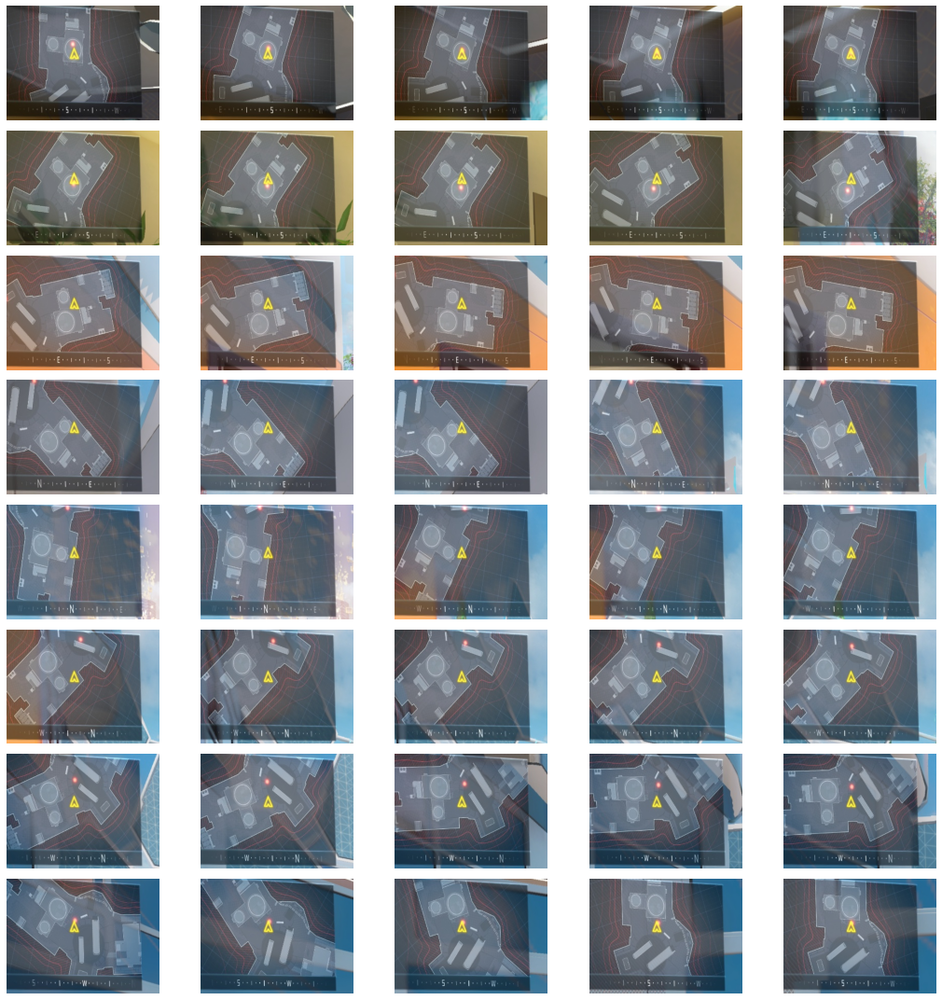

In [27]:
posicion_x = 8
filas = 8
df_mostrar = df_mapa

fig, axes = plt.subplots(filas, 5, figsize=(15, 15))

for i in range(filas):
    for j in range(5):
        # Obtener la ruta de la imagen
        ruta_imagen = df_mostrar.iloc[(posicion_x+i), (j+2)]  # Usamos j+2 para compensar el cambio de rango

        # Abrir la imagen y convertirla a matriz numpy
        imagen = Image.open("../" + ruta_imagen)
        matriz_np = np.array(imagen)

        # Mostrar la imagen en el subplot correspondiente
        axes[i, j].imshow(matriz_np)
        axes[i, j].axis('off')
    print(df_mostrar.at[(posicion_x+i), "reward"])

plt.tight_layout()
plt.show()


## SIN AUGMENTACION DE DATOS

### Separacion Dataset

In [123]:
# Dividir en entrenamiento y prueba (10% para prueba)
X_train_Mapa, X_test_Mapa = train_test_split(ARRAY_ID, test_size=0.1, random_state=42)
# Dividir entrenamiento en entrenamiento y validación (30% de 90% para validación)
X_train_Mapa, X_valid_Mapa = train_test_split(X_train_Mapa, test_size=0.3, random_state=42)

In [124]:
print("train ->"+str(len(X_train_Mapa)))
print("valid ->"+str(len(X_valid_Mapa)))
print("test ->"+str(len(X_test_Mapa)))

train ->2429
valid ->1042
test ->386


In [125]:
def crear_dataframe(lista_ids):
    # Crear un DataFrame vacío para almacenar los resultados
    df_mapa = pd.DataFrame()
    df_pov = pd.DataFrame()

    for id in lista_ids:
        query = f"SELECT * FROM videos_mapa WHERE id == {id}"
        query_pov = f"SELECT * FROM videos_pov WHERE id == {id}"

        # Leer el resultado de la consulta y añadirlo al DataFrame
        df_temporal = pd.read_sql_query(query, conexion)
        df_temporal_pov = pd.read_sql_query(query_pov, conexion)

        # Concatenar al DataFrame principal
        df_mapa = pd.concat([df_mapa, df_temporal], ignore_index=True)
        df_pov = pd.concat([df_pov, df_temporal_pov], ignore_index=True)
    
    return df_mapa , df_pov

In [126]:
df_train_mapa , df_train_pov = crear_dataframe(X_train_Mapa)
df_valid_mapa , df_valid_pov = crear_dataframe(X_valid_Mapa)
df_test_mapa , df_test_pov = crear_dataframe(X_test_Mapa)

In [127]:
conexion.close()

In [129]:
df_train_mapa[0:5]

,id,orden,mapa_01,mapa_02,mapa_03,mapa_04,mapa_05,etiqueta,reward
0,268,0,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,"[1, 2, 0]",21
1,268,1,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,"[0, 2, 0]",3
2,268,2,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,"[1, 1, 0]",11
3,268,3,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,"[1, 2, 0]",46
4,268,4,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,"[1, 1, 0]",96


In [130]:
import ast

def preprocesado_df(df):
    # Convertir la columna de tipo object a listas de enteros
    df['etiqueta'] = df['etiqueta'].apply(ast.literal_eval)
    # Eliminamos las filas donde 'mouse_final' sea igual a [0, 4]
    filtro = df['etiqueta'].apply(lambda x: x[1] == 4)
    df = df[~filtro]
    # Crear un filtro booleano para las filas que cumplen la condición
    condicion = df['etiqueta'].apply(lambda x: x[1] == 2)
    # Juntamos las pulsaciones y tecla en una columna
    #x_positions_2 = df['etiqueta'].apply(lambda x: str(x[0])+str(x[1]))
    x_positions_2 = df['etiqueta'].apply(lambda x: str(x[1]))
    df['etiqueta'] = x_positions_2
    # Modificar solo las filas que cumplen con la condición
    #df.loc[condicion, 'etiqueta'] = df.loc[condicion, 'etiqueta'].apply(lambda x: "12")
    return df

In [131]:
df_train_mapa = preprocesado_df(df_train_mapa)
df_valid_mapa = preprocesado_df(df_valid_mapa)
df_test_mapa = preprocesado_df(df_test_mapa)

/tmp/ipykernel_6529/1242670720.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['etiqueta'] = x_positions_2


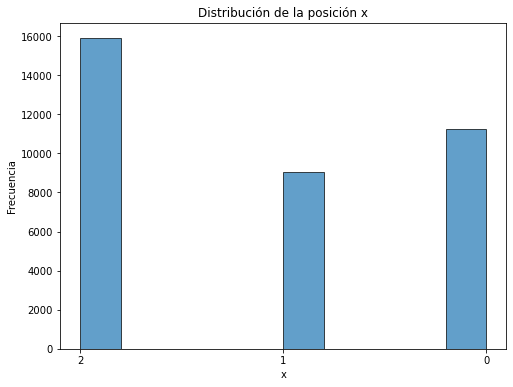

In [132]:
# Extraer la primera posición sin modificar el DataFrame
x_positions = df_train_mapa['etiqueta'].apply(lambda x: x[0])

# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(8, 6))

# Crear el histograma
ax.hist(x_positions, bins=10, edgecolor='black', alpha=0.7)

# Agregar el título y las etiquetas de los ejes
ax.set_title('Distribución de la posición x')
ax.set_xlabel('x')
ax.set_ylabel('Frecuencia')

# Mostrar la figura
plt.show()

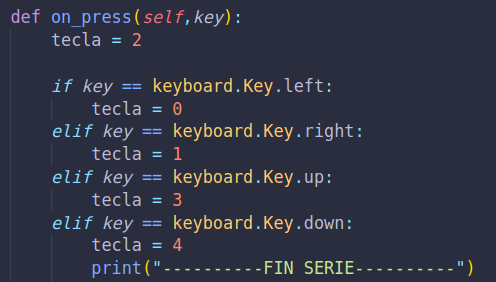

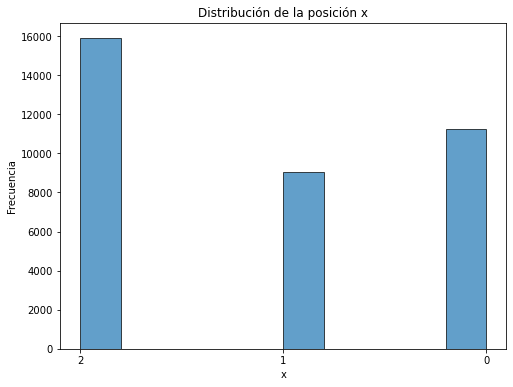

In [133]:
# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(8, 6))

# Crear el histograma
ax.hist(df_train_mapa['etiqueta'], bins=10, edgecolor='black', alpha=0.7)

# Agregar el título y las etiquetas de los ejes
ax.set_title('Distribución de la posición x')
ax.set_xlabel('x')
ax.set_ylabel('Frecuencia')

# Mostrar la figura
plt.show()

### One-Hot Encoding y balanceo de pesos

In [134]:
from sklearn.utils import class_weight

def aplicar_one_hot_balanceo(df,columa):
    # Crear un DataFrame con las columnas de one-hot encoding
    one_hot_df = pd.get_dummies(df[columa], prefix='label')

    # Unir el DataFrame original con el DataFrame de one-hot encoding
    df = pd.concat([df, one_hot_df], axis=1)

    # Balanceamos los pesos para el entrenamiento
    class_weights = class_weight.compute_class_weight(
        class_weight='balanced',
        classes=np.unique(df[columa]),
        y=df[columa]
    )

    # Crear un diccionario de pesos para las clases
    class_weight_dict = {i: class_weights[i] for i in range(len(class_weights))}

    #Eliminamos la columna original
    df = df.drop(columa, axis=1)
    return df , class_weight_dict

In [135]:
df_train_mapa , pesos_train = aplicar_one_hot_balanceo(df_train_mapa,"etiqueta")
df_valid_mapa , pesos_valid = aplicar_one_hot_balanceo(df_valid_mapa,"etiqueta")
df_test_mapa , pesos_test= aplicar_one_hot_balanceo(df_test_mapa,"etiqueta")

In [136]:
df_train_mapa[0:5]

,id,orden,mapa_01,mapa_02,mapa_03,mapa_04,mapa_05,reward,label_0,label_1,label_2
0,268,0,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,21,0,0,1
1,268,1,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,3,0,0,1
2,268,2,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,11,0,1,0
3,268,3,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,46,0,0,1
4,268,4,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,datos/grabacion/mini_mapa/mini_mapa_08-17-21-3...,96,0,1,0


In [137]:
pesos_train

{0: 1.0734217003232216, 1: 1.3316778869146157, 2: 0.7590321024931329}

## Lista con las etiquetas 

In [138]:
ETIQUETAS = np.array(df_train_mapa.filter(like='label').columns.tolist())

In [139]:
ETIQUETAS

array(['label_0', 'label_1', 'label_2'], dtype='<U7')

In [140]:
len(ETIQUETAS)

3

## Visualizacion DataFrame

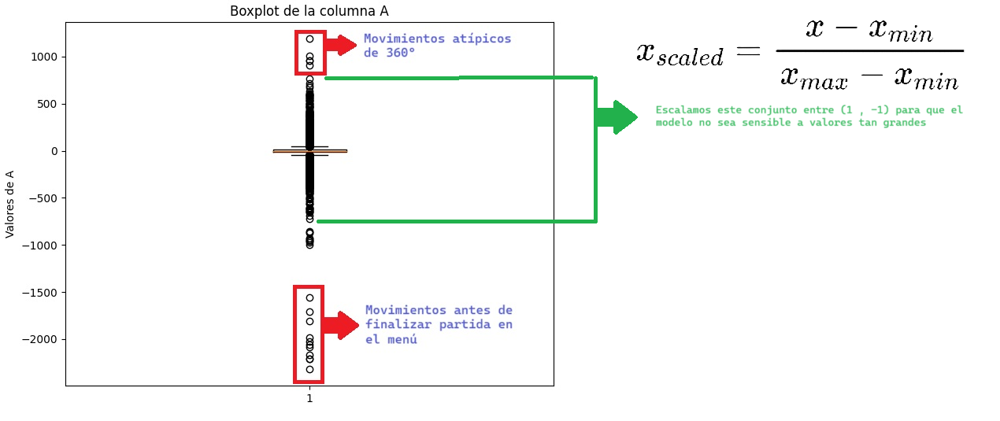

## Visualizacion Imagenes Dataset

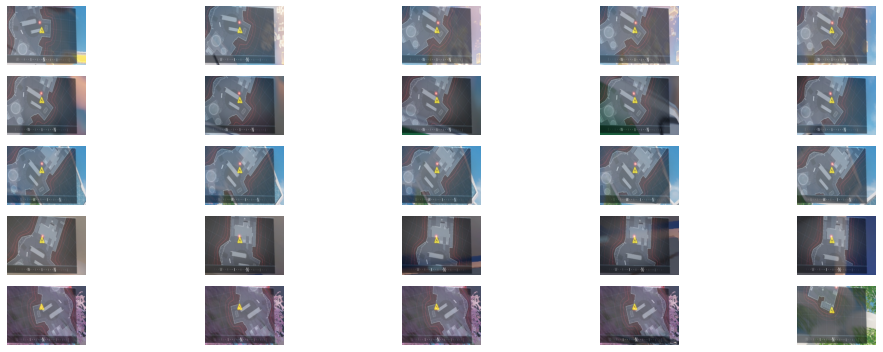

In [24]:
posicion_x = 10

fig, axes = plt.subplots(5, 5, figsize=(15, 5))

for i in range(5):
    for j in range(5):
        # Obtener la ruta de la imagen
        ruta_imagen = df_train_mapa.iloc[(posicion_x+i), (j+2)]  # Usamos j+2 para compensar el cambio de rango

        # Abrir la imagen y convertirla a matriz numpy
        imagen = Image.open("../" + ruta_imagen)
        matriz_np = np.array(imagen)

        # Mostrar la imagen en el subplot correspondiente
        axes[i, j].imshow(matriz_np)
        axes[i, j].axis('off')

plt.tight_layout()
plt.show()


## OBTENER REWARD

In [97]:
def mostrar_mascara(imagen,ancho_img, alto_img):
    # Convertir la imagen a espacio de color HSV
    hsv = cv2.cvtColor(imagen, cv2.COLOR_BGR2HSV)

    # Visualizar la imagen original
    plt.imshow(cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB))
    plt.title("Imagen Original")
    plt.axis('off')
    plt.show()

    # Definir el color rgba(224, 131, 126) y convertirlo a HSV
    rgba = np.array([224, 131, 126], dtype=np.uint8)  # Color en RGB
    color_hsv = cv2.cvtColor(np.reshape(rgba, (1, 1, 3)), cv2.COLOR_RGB2HSV)
    
    # Descomponer en Hue, Saturation y Value
    h, s, v = color_hsv[0, 0]

    # Rango ampliado alrededor del color objetivo
    margen_h = 20
    margen_s = 70
    margen_v = 70

    # Definir el rango bajo y alto
    bajo = np.array([max(h - margen_h, 0), max(s - margen_s, 0), max(v - margen_v, 0)])
    alto = np.array([min(h + margen_h, 180), min(s + margen_s, 255), min(v + margen_v, 255)])

    # Crear la máscara
    mask = cv2.inRange(hsv, bajo, alto)

    # Mostrar la máscara
    plt.imshow(mask, cmap='gray')
    plt.title("Máscara de tonalidades similares a rgba(224, 131, 126)")
    plt.axis('off')
    plt.show()

    # Aplicar la máscara a la imagen original
    resultado = cv2.bitwise_and(imagen, imagen, mask=mask)

    # Mostrar la imagen con las áreas resaltadas
    plt.imshow(cv2.cvtColor(resultado, cv2.COLOR_BGR2RGB))
    plt.title("Zonas resaltadas")
    plt.axis('off')
    plt.show()

    # Información sobre los píxeles detectados
    print("Píxeles detectados:", np.sum(mask > 0))

    # Calcular el centroide de la máscara
    moments = cv2.moments(mask)
    if moments["m00"] != 0:
        cx = int(moments["m10"] / moments["m00"])
        cy = int(moments["m01"] / moments["m00"])
        print(f"Píxel con mayor concentración: ({cx}, {cy})")
        
        # Mostrar el píxel en la imagen original
        print(f"Color en el píxel de mayor concentración: {imagen[cy, cx]}")
        return calcular_distancia(ancho_img,alto_img,cx,cy)
    else:
        print("No se detectaron píxeles en la máscara.")
        return 200

def transformar_imagen(primera_fila):
    # Cargar la imagen usando PIL
    ruta_imagen = "../" + str(primera_fila.iloc[2])
    imagen = Image.open(ruta_imagen)

    # Aplicar rotación y recorte
    ancho, alto = imagen.size
    imagen = imagen.rotate(2.5, expand=True)
    imagen = imagen.crop((5, 12, ancho - 35, alto - 25))

    # Convertir la imagen a un array numpy
    matriz_np = np.array(imagen)

    # Si la imagen tiene un canal alfa, lo eliminamos
    if matriz_np.shape[-1] == 4:
        matriz_np = matriz_np[:, :, :3]  # Eliminar el canal alfa

    # Convertir a BGR para OpenCV
    imagen_bgr = cv2.cvtColor(matriz_np, cv2.COLOR_RGB2BGR)

    # Procesar la imagen para detectar píxeles rojos
    return mostrar_mascara(imagen_bgr,imagen_bgr.shape[1],imagen_bgr.shape[0])


def calcular_distancia(ancho, alto, x_pixel, y_pixel):

    # Calcular el centro de la imagen
    centro_x = ancho / 2
    centro_y = alto / 2
    
    # Ajustar las coordenadas para que el centro sea (0, 0)
    x_ajustado = x_pixel - centro_x
    y_ajustado = y_pixel - centro_y
    
    # Calcular la distancia al centro
    distancia = math.sqrt(x_ajustado**2 + y_ajustado**2)
    print(f"x: {x_ajustado} y:{y_ajustado}")
    
    return distancia

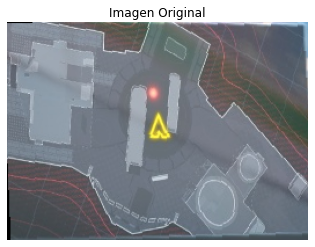

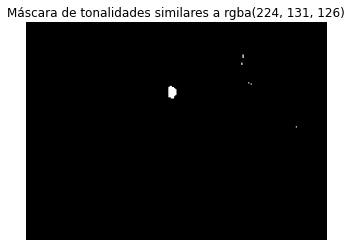

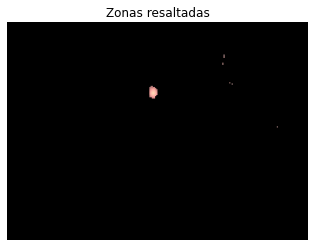

Píxeles detectados: 70
Píxel con mayor concentración: (133, 58)
Color en el píxel de mayor concentración: [119 112 127]
x: 3.0 y:-36.0
La distancia desde el píxel al centro es: 36.124783736376884


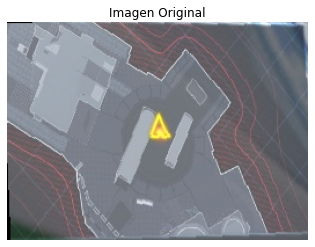

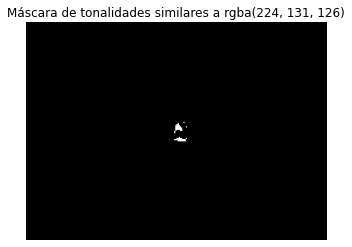

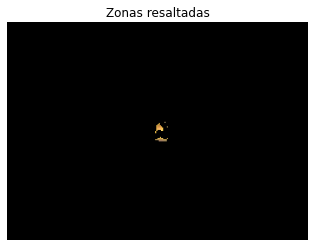

Píxeles detectados: 55
Píxel con mayor concentración: (132, 95)
Color en el píxel de mayor concentración: [ 88 255 255]
x: 2.0 y:1.0
La distancia desde el píxel al centro es: 2.23606797749979


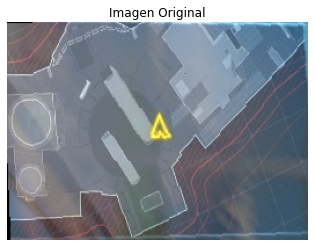

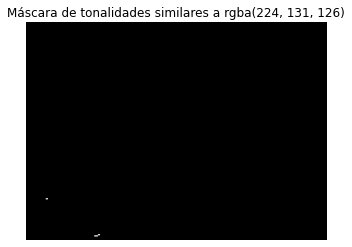

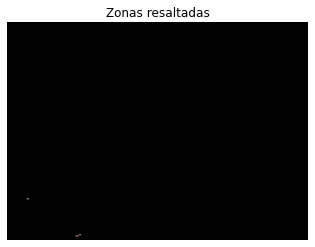

Píxeles detectados: 7
Píxel con mayor concentración: (48, 174)
Color en el píxel de mayor concentración: [ 81  82 103]
x: -82.0 y:80.0
La distancia desde el píxel al centro es: 114.56002793295748


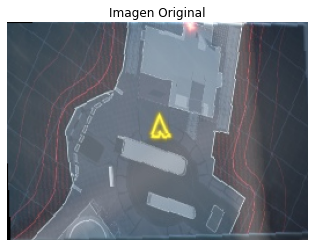

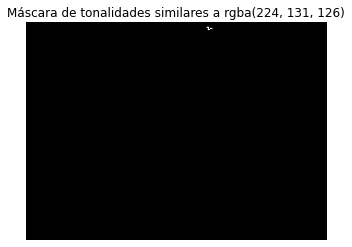

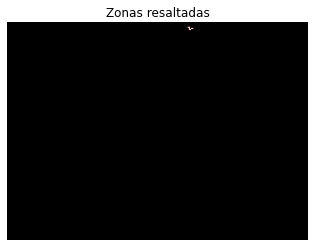

Píxeles detectados: 7
Píxel con mayor concentración: (157, 5)
Color en el píxel de mayor concentración: [202 208 255]
x: 27.0 y:-89.0
La distancia desde el píxel al centro es: 93.00537618869137


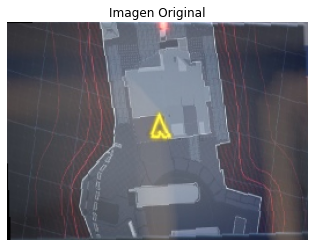

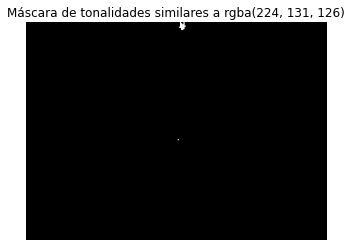

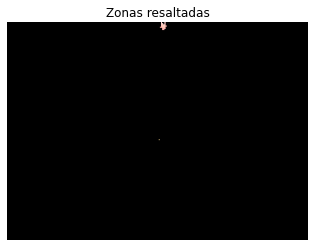

Píxeles detectados: 25
Píxel con mayor concentración: (134, 6)
Color en el píxel de mayor concentración: [165 165 241]
x: 4.0 y:-88.0
La distancia desde el píxel al centro es: 88.09086218218096


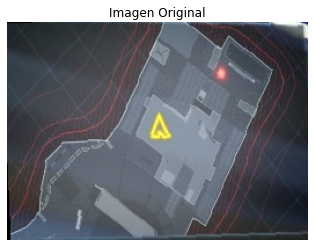

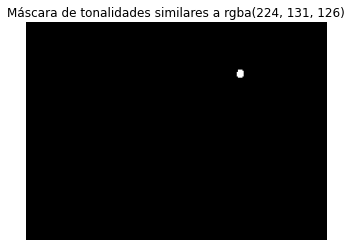

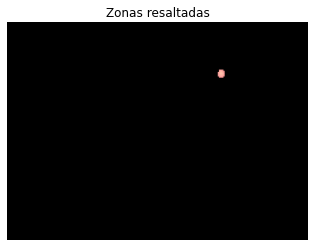

Píxeles detectados: 37
Píxel con mayor concentración: (184, 44)
Color en el píxel de mayor concentración: [171 195 255]
x: 54.0 y:-50.0
La distancia desde el píxel al centro es: 73.59347797189639


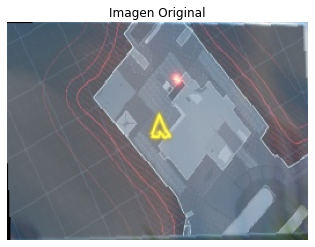

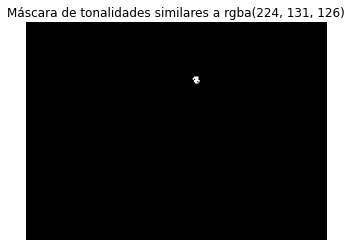

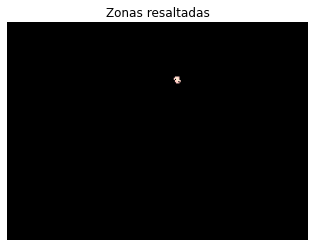

Píxeles detectados: 25
Píxel con mayor concentración: (146, 49)
Color en el píxel de mayor concentración: [210 239 255]
x: 16.0 y:-45.0
La distancia desde el píxel al centro es: 47.75981574503821


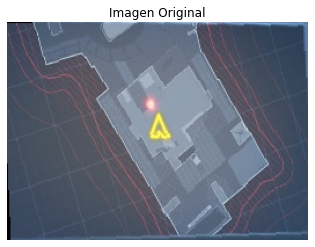

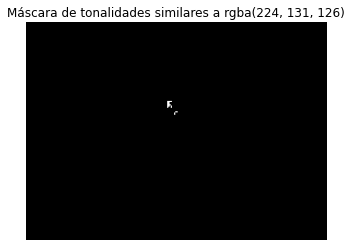

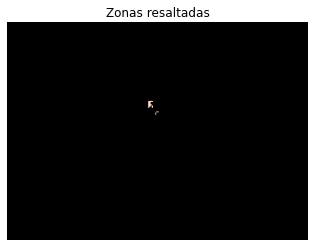

Píxeles detectados: 20
Píxel con mayor concentración: (124, 71)
Color en el píxel de mayor concentración: [207 228 249]
x: -6.0 y:-23.0
La distancia desde el píxel al centro es: 23.769728648009426


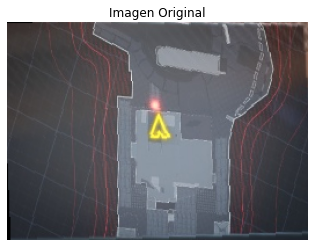

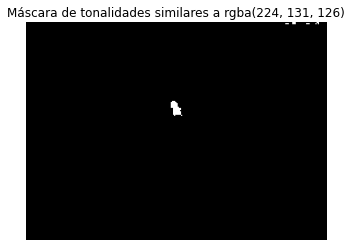

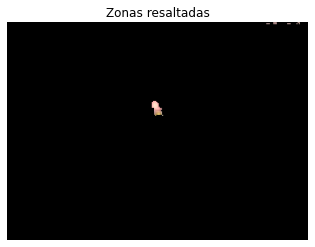

Píxeles detectados: 92
Píxel con mayor concentración: (147, 61)
Color en el píxel de mayor concentración: [111 102  99]
x: 17.0 y:-33.0
La distancia desde el píxel al centro es: 37.12142238654117


: 

In [ ]:
posicion = 200

for numero in range(1, 10):
    primera_fila = df_train_mapa.iloc[posicion+numero]
    distancia = transformar_imagen(primera_fila)
    print(f"La distancia desde el píxel al centro es: {distancia}")

Tamaño imagen -> (260, 188)
Tamaño matriz -> (188, 260, 3)


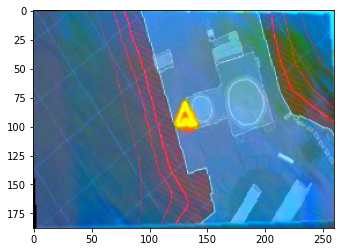

In [26]:
primera_fila = df_train_mapa.iloc[0]
imagen = Image.open("../" +str(primera_fila.iloc[2]))
ancho, alto = imagen.size

imagen = imagen.rotate(2.5, expand=True)
# Recorta la imagen (izquierda, superior, derecha, inferior)
imagen = imagen.crop((5, 12, ancho - 35, alto-25))

enhancer = ImageEnhance.Color(imagen)
imagen_augment01 = enhancer.enhance(5)  # Aumento de contraste
matriz_np = np.array(imagen_augment01)
print("Tamaño imagen -> "+str(imagen_augment01.size))
print("Tamaño matriz -> "+ str(matriz_np.shape))
plt.imshow(matriz_np)
plt.axis('on')
plt.show()

Tamaño imagen -> (260, 188)
Tamaño matriz -> (188, 260, 3)


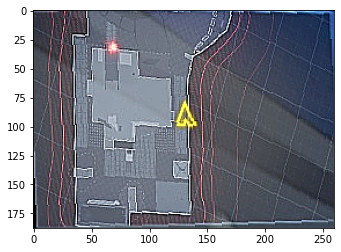

In [112]:
primera_fila = df_mapa.iloc[0]
imagen = Image.open("../" +str(primera_fila.iloc[2]))
ancho, alto = imagen.size

imagen = imagen.rotate(2.5, expand=True)
# Recorta la imagen (izquierda, superior, derecha, inferior)
imagen = imagen.crop((5, 12, ancho - 35, alto-25))

enhancer = ImageEnhance.Sharpness(imagen)
imagen_augment01 = enhancer.enhance(7)  # Aumento de contraste
matriz_np = np.array(imagen_augment01)
print("Tamaño imagen -> "+str(imagen_augment01.size))
print("Tamaño matriz -> "+ str(matriz_np.shape))
plt.imshow(matriz_np)
plt.axis('on')
plt.show()

Tamaño imagen -> (260, 188)
Tamaño matriz -> (188, 260, 3)


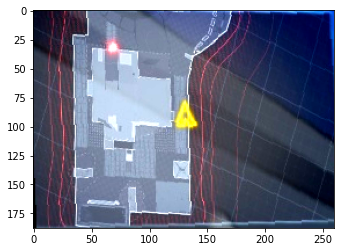

In [111]:
primera_fila = df_mapa.iloc[0]
imagen = Image.open("../" +str(primera_fila.iloc[2]))
ancho, alto = imagen.size

imagen = imagen.rotate(2.5, expand=True)
# Recorta la imagen (izquierda, superior, derecha, inferior)
imagen = imagen.crop((5, 12, ancho - 35, alto-25))

enhancer = ImageEnhance.Contrast(imagen)
imagen_augment01 = enhancer.enhance(2)  # Aumento de contraste
matriz_np = np.array(imagen_augment01)
print("Tamaño imagen -> "+str(imagen_augment01.size))
print("Tamaño matriz -> "+ str(matriz_np.shape))
plt.imshow(matriz_np)
plt.axis('on')
plt.show()

# Funcion Del Batch

In [25]:
from keras.utils import Sequence

class ImageDataGenerator(Sequence):
    def __init__(self, df , sequence_length ,image_height , image_width , batch_size, filtro, **kwargs):
        self.df = df
        self.image_sequence_length = sequence_length
        self.image_height = image_height
        self.image_width = image_width
        self.batch_size = batch_size
        self.POV = filtro
        super().__init__(**kwargs)  # Llamada al constructor de la clase base

    def __len__(self):
        return int(np.ceil(len(self.df) / float(self.batch_size)))

    def cargar_todo(self,fin_df):
        batch_df = self.df.iloc[0:fin_df]     #Obtenemos un lote del df

        X_batch = np.zeros((len(batch_df), self.image_sequence_length ,self.image_height, self.image_width, 3))  # Inicializar matriz para las imágenes
        #y_batch = batch_df[['izquieda', 'derecha', 'delante']].values
        y_batch = np.array(batch_df['mouse_final'].tolist())

        for i, (_, row) in enumerate(batch_df.iterrows()):
            frames = []
            for j in range(self.image_sequence_length):
                imagen = Image.open("../" + row.iloc[j])    # Obtener la ruta de la imagen
                imagen = Image.fromarray(np.array(imagen)).filter(ImageFilter.SHARPEN)  #Aplicamos Filtro SHARPEN
                imagen = np.array(imagen) / 255.0           # Normalizar la imagen

                frames.append(imagen)                  #Juntamos frames en lista
            video = np.stack(frames, axis=0)           # Convertir lista de frames en un video np
            X_batch[i] = video

        return X_batch, y_batch

    def __getitem__(self, index):
        inicio_lote = index * self.batch_size
        final_lote = (index + 1) * self.batch_size

        batch_df = self.df.iloc[inicio_lote:final_lote]     #Obtenemos un lote del df

        X_batch = np.zeros((len(batch_df), self.image_sequence_length ,self.image_height, self.image_width, 3))  # Inicializar matriz para las imágenes
        # Obtener y_batch después del one-hot encoding
        #y_batch = batch_df[['izquieda', 'derecha','delante']].values
        #y_batch = np.array(batch_df['mouse_final'].tolist())

        # Filtrar las columnas que comienzan con 'label'
        y_batch = batch_df.filter(like='label').values

        for i, (_, row) in enumerate(batch_df.iterrows()):
            frames = []
            for j in range(self.image_sequence_length):
                imagen = Image.open("../" + row.iloc[j+2])    # Obtener la ruta de la imagen
                ancho, alto = imagen.size

                if self.POV == True :
                    imagen = imagen.rotate(2.5, expand=True)
                    # Recorta la imagen (izquierda, superior, derecha, inferior)
                    imagen = imagen.crop((5, 12, ancho - 35, alto-25))
                    imagen = ImageEnhance.Sharpness(imagen)
                    imagen = imagen.enhance(7)  # Aumento de contraste

                imagen = np.array(imagen) / 255.0           # Normalizar la imagen

                frames.append(imagen)                  #Juntamos frames en lista
            video = np.stack(frames, axis=0)           # Convertir lista de frames en un video np
            X_batch[i] = video

        return X_batch, y_batch

def comprobar_contenido(X_train , Y_train , num_video):

    fig, axs = plt.subplots(1, 5, figsize=(5 * 2, 1 * 2))

    for i in range(5):
        axs[i].imshow(X_train[num_video][i])
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()
    print(Y_train[num_video])
    return Y_train[num_video]

In [26]:
class ImageDataGeneratorVAR(ImageDataGenerator):
    def __init__(self, df , sequence_length ,image_height , image_width , batch_size, filtro,autoencoder,encoder = None,**kwargs):
        self.autoencoder = autoencoder
        self.encoder_entrenado = encoder
        super().__init__(df, sequence_length, image_height, image_width, batch_size, filtro, **kwargs)

    def __len__(self):
        return int(np.ceil(len(self.df) / float(self.batch_size)))

    def cargar_todo(self,fin_df):
        batch_df = self.df.iloc[0:fin_df]     #Obtenemos un lote del df

        X_batch = np.zeros((len(batch_df), self.image_sequence_length ,self.image_height, self.image_width, 3))  # Inicializar matriz para las imágenes
        #y_batch = batch_df[['izquieda', 'derecha', 'delante']].values
        y_batch = np.array(batch_df['mouse_final'].tolist())

        for i, (_, row) in enumerate(batch_df.iterrows()):
            frames = []
            for j in range(self.image_sequence_length):
                imagen = Image.open("../" + row.iloc[j])    # Obtener la ruta de la imagen
                imagen = Image.fromarray(np.array(imagen)).filter(ImageFilter.SHARPEN)  #Aplicamos Filtro SHARPEN
                imagen = np.array(imagen) / 255.0           # Normalizar la imagen

                frames.append(imagen)                  #Juntamos frames en lista
            video = np.stack(frames, axis=0)           # Convertir lista de frames en un video np
            X_batch[i] = video

        return X_batch, y_batch

    def __getitem__(self, index):
        inicio_lote = index * self.batch_size
        final_lote = (index + 1) * self.batch_size

        batch_df = self.df.iloc[inicio_lote:final_lote]     #Obtenemos un lote del df

        X_batch = np.zeros((len(batch_df), self.image_sequence_length ,self.image_height, self.image_width, 3))  # Inicializar matriz para las imágenes

        # Filtrar las columnas que comienzan con 'label'
        y_batch = batch_df.filter(like='label').values

        for i, (_, row) in enumerate(batch_df.iterrows()):
            frames = []
            for j in range(self.image_sequence_length):
                imagen = Image.open("../" + row.iloc[j+2])    # Obtener la ruta de la imagen
                ancho, alto = imagen.size

                if self.POV == True :
                    imagen = imagen.rotate(2.5, expand=True)
                    # Recorta la imagen (izquierda, superior, derecha, inferior)
                    imagen = imagen.crop((5, 12, ancho - 35, alto-25))
                    imagen = ImageEnhance.Sharpness(imagen)
                    imagen = imagen.enhance(7)  # Aumento de contraste

                imagen = np.array(imagen) / 255.0           # Normalizar la imagen

                frames.append(imagen)                  #Juntamos frames en lista
            video = np.stack(frames, axis=0)           # Convertir lista de frames en un video np
            X_batch[i] = video
        
        #Para autoencoder
        if self.autoencoder == True:
            return X_batch, X_batch
        else : 
            #Encoder
            espacio_latente = self.encoder_entrenado.predict(X_batch,verbose=0)
            return espacio_latente, y_batch

def comprobar_contenido(X_train , num_video):

    fig, axs = plt.subplots(1, 5, figsize=(5 * 2, 1 * 2))

    for i in range(5):
        axs[i].imshow(X_train[num_video][i])
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()

# PREPARACIÒN ENTRENAMIENTO

## Train Split

# Generadores

In [27]:
BATCH = 10

In [34]:
# Generador Mapa
altura_img_mini = 188
anchura_img_mini = 260
batch_size = BATCH #videos por batch

# Generadores de Batches Mini-Mapa
train_generator_Mapa = ImageDataGenerator(df_train_mapa, sequence_length=5, image_height=altura_img_mini, image_width=anchura_img_mini, batch_size=batch_size ,filtro =True)
test_generator_Mapa = ImageDataGenerator(df_test_mapa, sequence_length=5, image_height=altura_img_mini, image_width=anchura_img_mini, batch_size=batch_size ,filtro =True)
valid_generator_Mapa = ImageDataGenerator(df_valid_mapa, sequence_length=5, image_height=altura_img_mini, image_width=anchura_img_mini, batch_size=batch_size ,filtro =True)

In [30]:
from keras.models import load_model ,Model 

#model_autoencoder = load_model('../modelos/modelo_autoencoder_02.h5')
# Extraer el encoder del modelo autoencoder
#encoder_entrenado = Model(inputs=model_autoencoder.input, outputs=model_autoencoder.get_layer('time_distributed_7').output) 

encoder_entrenado = None
autoencoder = True
# Generador Mapa
altura_img_mini = 188
anchura_img_mini = 260
batch_size = BATCH 

# Generadores para autoencoder
train_generator_Mapa = ImageDataGeneratorVAR(df_train_mapa, sequence_length=5, image_height=altura_img_mini, image_width=anchura_img_mini, batch_size=batch_size ,filtro =True , autoencoder = autoencoder , encoder= encoder_entrenado)
test_generator_Mapa = ImageDataGeneratorVAR(df_test_mapa, sequence_length=5, image_height=altura_img_mini, image_width=anchura_img_mini, batch_size=batch_size ,filtro =True, autoencoder = autoencoder, encoder= encoder_entrenado)
valid_generator_Mapa = ImageDataGeneratorVAR(df_valid_mapa, sequence_length=5, image_height=altura_img_mini, image_width=anchura_img_mini, batch_size=batch_size ,filtro =True, autoencoder = autoencoder, encoder= encoder_entrenado)

7


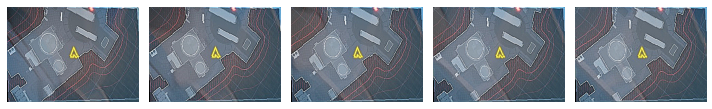

[0 1 0]


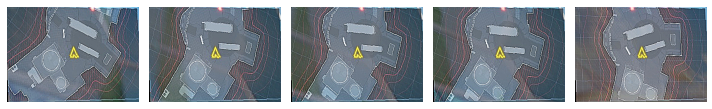

[0 1 0]


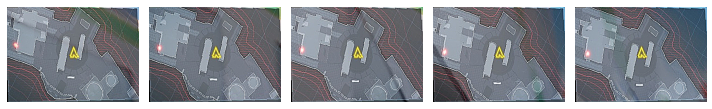

[1 0 0]


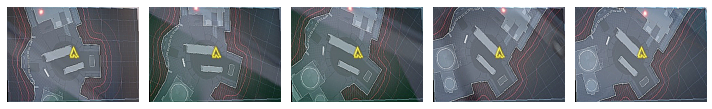

[1 0 0]


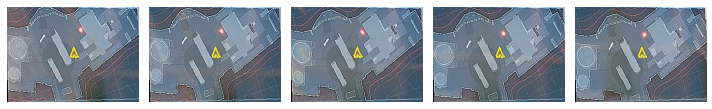

[1 0 0]


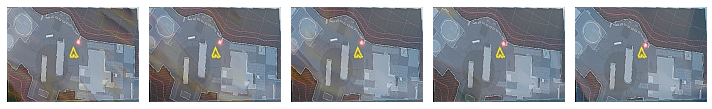

[0 0 1]


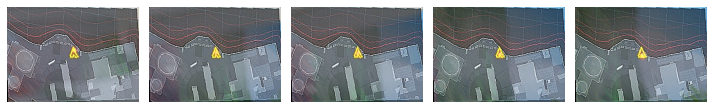

[1 0 0]


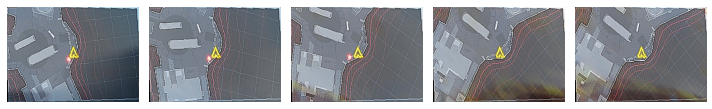

[0 0 1]


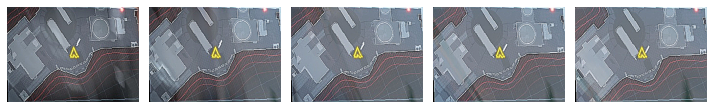

[0 0 1]


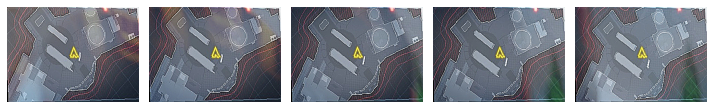

[0 1 0]


In [35]:
#Cantidad de batches en los que se divide el df
print(train_generator_Mapa.__len__())

#Comprobamos funcionamiento bach
X_batch, Y_batch = train_generator_Mapa.__getitem__(2)

for i in range(0,batch_size):  # 4 es el maximo de conjunto de imagenes del batch creado
    # Seleccionamos ver la posicion numero 0 del batch creado
    comprobar_contenido(X_batch ,i)
    print(Y_batch[i])

In [32]:
#Cantidad de batches en los que se divide el df
print(train_generator_Mapa.__len__())

#Comprobamos funcionamiento bach
X_batch, Y_batch = train_generator_Mapa.__getitem__(1)

for i in range(0,batch_size):  # 4 es el maximo de conjunto de imagenes del batch creado
    # Seleccionamos ver la posicion numero 0 del batch creado
    y = comprobar_contenido(X_batch,Y_batch ,i)


7


TypeError: comprobar_contenido() takes 2 positional arguments but 3 were given

### Modelo Normal

In [29]:
from tensorflow.keras.models import Model 
#from keras.layers import Input, ConvLSTM2D, TimeDistributed, BatchNormalization,MaxPooling2D, Dropout, Conv3D, MaxPooling3D, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping ,ReduceLROnPlateau,ModelCheckpoint
from tensorflow.keras.regularizers import l2

In [29]:
from keras.layers import Input, TimeDistributed ,Conv2D, LSTM, BatchNormalization,MaxPooling2D, Dropout, Flatten, Dense ,Concatenate

def generator(input_shape_pov):

    input_shape_pov = Input(shape=input_shape_pov)

    # Capas Conv2D
    conv2d = TimeDistributed(Conv2D(32, (3, 3), activation='relu', padding='same'))(input_shape_pov)
    batchnorm_layer = TimeDistributed(BatchNormalization())(conv2d)
    maxpool_layer = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer)
    dropout_mapa_01 = TimeDistributed(Dropout(0.2))(maxpool_layer)

    conv2d02 = TimeDistributed(Conv2D(64, (3, 3), activation='relu', padding='same'))(dropout_mapa_01)
    batchnorm_layer_02 = TimeDistributed(BatchNormalization())(conv2d02)
    maxpool_layer_02 = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer_02)
    dropout_mapa_02 = TimeDistributed(Dropout(0.2))(maxpool_layer_02)

    conv2d03 = TimeDistributed(Conv2D(128, (3, 3), activation='relu', padding='same'))(dropout_mapa_02)
    batchnorm_layer_03 = TimeDistributed(BatchNormalization())(conv2d03)
    maxpool_layer_03 = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer_03)
    dropout_mapa_03 = TimeDistributed(Dropout(0.2))(maxpool_layer_03)

    conv2d04 = TimeDistributed(Conv2D(245, (3, 3), activation='relu', padding='same'))(dropout_mapa_03)
    batchnorm_layer_04 = TimeDistributed(BatchNormalization())(conv2d04)
    maxpool_layer_04 = TimeDistributed(MaxPooling2D(pool_size=(2, 2)))(batchnorm_layer_04)
    dropout_mapa_04 = TimeDistributed(Dropout(0.2))(maxpool_layer_04)

    flat1 = TimeDistributed(Flatten())(dropout_mapa_04)

    # Capa LSTM
    lstm01 = LSTM(128 , return_sequences=True)(flat1)
    lstm02 = LSTM(84)(lstm01)

    # Capas Densa (puedes ajustar el número de unidades y dropout)
    dense_out_02 = Dense(400, activation='relu')(lstm02)
    drop_dense_02 = Dropout((0.5))(dense_out_02)

    # Capas Densa (puedes ajustar el número de unidades y dropout)
    dense_out_03 = Dense(200, activation='relu')(drop_dense_02)
    drop_dense_03 = Dropout((0.5))(dense_out_03)

    # Capa Salida
    output = Dense(len(ETIQUETAS), activation='softmax')(drop_dense_03)

    model = Model(inputs=input_shape_pov, outputs=output)
    return model

In [31]:
from tensorflow.keras.optimizers import Adam

def discriminator(input_dim):
    # Entrada del discriminador: recibe un vector de probabilidades o un vector one-hot
    discriminator_input = Input(shape=(input_dim,))
    
    # Capa oculta
    dense_01 = Dense(94, activation='relu')(discriminator_input)
    
    # Salida binaria: 1 para acción real, 0 para acción generada
    output = Dense(1, activation='sigmoid')(dense_01)
    
    # Definición del modelo
    discriminator = Model(discriminator_input, output)
    return discriminator

### VAR

In [33]:
from keras.models import Model
from keras.layers import Input, TimeDistributed, Conv2D, MaxPooling2D, UpSampling2D, Cropping2D

def auto_encoder(input_shape_pov):
    # Capa de entrada para el autoencoder
    inputs = Input(shape=input_shape_pov)

    # Codificador
    x = TimeDistributed(Conv2D(32, (3, 3), activation='relu', padding='same'))(inputs)
    x = TimeDistributed(MaxPooling2D((2, 2)))(x)
    x = TimeDistributed(Conv2D(64, (3, 3), activation='relu', padding='same'))(x)
    x = TimeDistributed(MaxPooling2D((2, 2)))(x)
    x = TimeDistributed(Conv2D(128, (3, 3), activation='relu', padding='same'))(x)
    x = TimeDistributed(MaxPooling2D((2, 2), padding='same'))(x)
    x = TimeDistributed(Conv2D(256, (3, 3), activation='relu', padding='same'))(x)
    x = TimeDistributed(MaxPooling2D((2, 2), padding='same'))(x)
    x = TimeDistributed(Conv2D(512, (3, 3), activation='relu', padding='same'))(x)
    encoded = TimeDistributed(MaxPooling2D((2, 2), padding='same'))(x)

    # Decodificador
    x = TimeDistributed(Conv2D(512, (3, 3), activation='relu', padding='same'))(encoded)
    x = TimeDistributed(UpSampling2D((2, 2)))(x)
    x = TimeDistributed(Conv2D(256, (3, 3), activation='relu', padding='same'))(x)
    x = TimeDistributed(UpSampling2D((2, 2)))(x)
    x = TimeDistributed(Conv2D(128, (3, 3), activation='relu', padding='same'))(x)
    x = TimeDistributed(UpSampling2D((2, 2)))(x)
    x = TimeDistributed(Conv2D(64, (3, 3), activation='relu', padding='same'))(x)
    x = TimeDistributed(UpSampling2D((2, 2)))(x)
    x = TimeDistributed(Conv2D(32, (3, 3), activation='relu', padding='same'))(x)
    x = TimeDistributed(UpSampling2D((2, 2)))(x)
    x = TimeDistributed(Conv2D(3, (3, 3), activation='sigmoid', padding='same'))(x)

    # Recortar la imagen (2,2)de alto (6,6)ancho 
    decoded = TimeDistributed(Cropping2D(((2, 2), (14,14))))(x)
    
    return inputs, encoded , decoded


timesteps = 5
height = 188
width = 260
channels = 3
input_shape_pov = (timesteps, height, width, channels) # Modelo Pov
input_latente= Input(shape=(176, 256, 3))

inputs,encoded,decoded = auto_encoder(input_shape_pov)
model_autoencoder = Model(inputs, decoded)


In [ ]:
timesteps = 5
height = 188
width = 260
channels = 3
input_shape_pov = (timesteps, height, width, channels) # Modelo Pov
input_latente= Input(shape=(176, 256, 3))

inputs,encoded,decoded = auto_encoder(input_shape_pov , 16)
model_autoencoder = Model(inputs, decoded)

In [34]:
model_autoencoder.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 5, 188, 260, 3) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_22             │ (None, 5, 188, 260,    │           896 │
│ (TimeDistributed)               │ 32)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_23             │ (None, 5, 94, 130, 32) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_24             │ (None, 5, 94, 130, 64) │        18,496 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_25             │ (None, 5, 47, 65, 64)  │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_26             │ (None, 5, 47, 65, 128) │        73,856 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_27             │ (None, 5, 24, 33, 128) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_28             │ (None, 5, 24, 33, 256) │       295,168 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_29             │ (None, 5, 12, 17, 256) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_30             │ (None, 5, 12, 17, 512) │     1,180,160 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_31             │ (None, 5, 6, 9, 512)   │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_32             │ (None, 5, 6, 9, 512)   │     2,359,808 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_33             │ (None, 5, 12, 18, 512) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_34             │ (None, 5, 12, 18, 256) │     1,179,904 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_35             │ (None, 5, 24, 36, 256) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_36             │ (None, 5, 24, 36, 128) │       295,040 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_37             │ (None, 5, 48, 72, 128) │             0 │
│ (TimeDistributed)               │                        │             

 Total params: 5,496,451 (20.97 MB)

 Trainable params: 5,496,451 (20.97 MB)

 Non-trainable params: 0 (0.00 B)

In [35]:
from tensorflow.keras.losses import MeanSquaredError

# Compilar el autoencoder
model_autoencoder.compile(optimizer='adam', loss=MeanSquaredError())
# Configurar EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min',restore_best_weights=True)
model_checkpoint = ModelCheckpoint('modelo_autoencoder_512.keras',monitor='val_loss',save_best_only=True,verbose=1)

In [ ]:
import time

# Registro del tiempo de inicio
start_time = time.time()

# Entrenamiento Mini-Mapa
history = model_autoencoder.fit(train_generator_Mapa,
                    epochs=100,
                    validation_data=valid_generator_Mapa,
                    callbacks=[early_stopping,model_checkpoint]
                    )

model_autoencoder.save('modelo_autoencoder_512.h5')

# Registro del tiempo de finalización
end_time = time.time()

Epoch 1/100


I0000 00:00:1731838290.957283   22622 service.cc:146] XLA service 0x780140017080 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731838290.957303   22622 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce GTX 1070, Compute Capability 6.1
2024-11-17 11:11:31.232070: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-17 11:11:31.665282: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 90400
2024-11-17 11:11:40.679830: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_1', 72 bytes spill stores, 204 bytes spill loads

I0000 00:00:1731838300.696885   22622 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the proces

 210/2138 ━━━━━━━━━━━━━━━━━━━━ 8:18 258ms/step - loss: 0.0317

2024-11-17 11:12:34.876043: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:393] ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_9', 932 bytes spill stores, 1088 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_select_fusion_1', 568 bytes spill stores, 808 bytes spill loads



2138/2138 ━━━━━━━━━━━━━━━━━━━━ 0s 239ms/step - loss: 0.0221
Epoch 1: val_loss improved from inf to 0.01528, saving model to modelo_autoencoder_512.keras
2138/2138 ━━━━━━━━━━━━━━━━━━━━ 648s 297ms/step - loss: 0.0221 - val_loss: 0.0153
Epoch 2/100
2138/2138 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step - loss: 0.0152
Epoch 2: val_loss improved from 0.01528 to 0.01400, saving model to modelo_autoencoder_512.keras
2138/2138 ━━━━━━━━━━━━━━━━━━━━ 610s 285ms/step - loss: 0.0152 - val_loss: 0.0140
Epoch 3/100
2138/2138 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0136
Epoch 3: val_loss improved from 0.01400 to 0.01296, saving model to modelo_autoencoder_512.keras
2138/2138 ━━━━━━━━━━━━━━━━━━━━ 608s 285ms/step - loss: 0.0136 - val_loss: 0.0130
Epoch 4/100
2138/2138 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step - loss: 0.0125
Epoch 4: val_loss improved from 0.01296 to 0.01201, saving model to modelo_autoencoder_512.keras
2138/2138 ━━━━━━━━━━━━━━━━━━━━ 608s 284ms/step - loss: 0.0125 - val_loss: 0.0120
Epoch 5/100
2138

In [75]:
imagen_recostruida = model_autoencoder.predict(X_batch)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 831ms/step


In [79]:
imagen_recostruida.shape

(10, 5, 188, 260, 3)

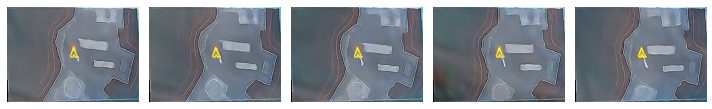

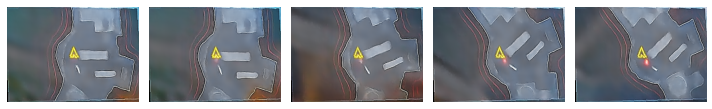

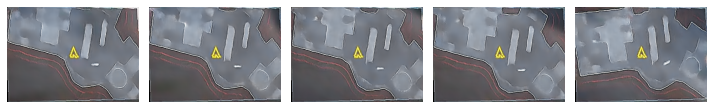

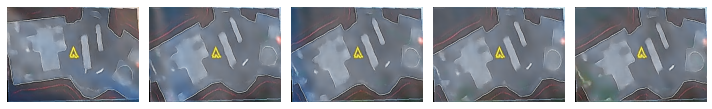

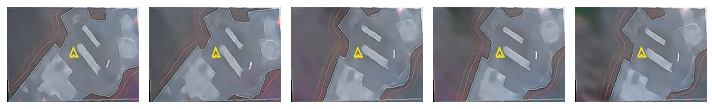

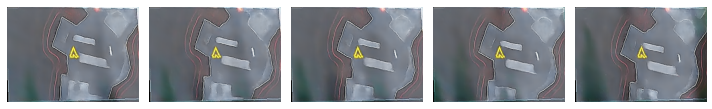

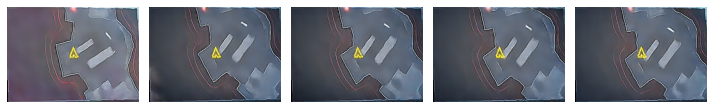

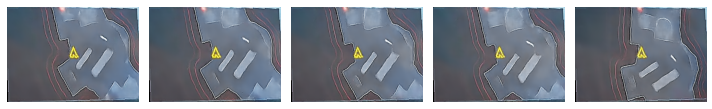

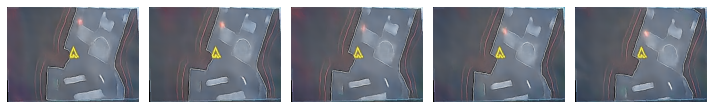

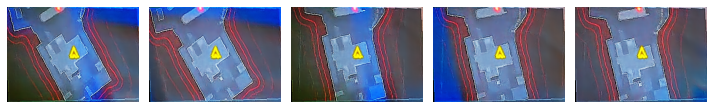

In [78]:
for i in range(0,batch_size):  # 4 es el maximo de conjunto de imagenes del batch creado
    # Seleccionamos ver la posicion numero 0 del batch creado
    comprobar_contenido(imagen_recostruida ,i)

In [81]:
espacio_latente = encoder_entrenado.predict(X_batch)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step


In [82]:
espacio_latente.shape

(10, 5, 12, 17, 256)

In [30]:
from keras.layers import  Dropout, Dense ,TimeDistributed,Flatten,Input,LSTM

def espacio_latente_accion(espacio_latente):

    input = Input(shape=espacio_latente)
    # Aplanar la entrada para que sea compatible con capas densas
    x = TimeDistributed(Flatten())(input)
    x = LSTM(256, return_sequences=True, dropout=0.2, recurrent_dropout=0.2)(x)
    x = LSTM(256, return_sequences=False, dropout=0.2, recurrent_dropout=0.2)(x)

    # Capas Densa
    x = Dense(500, activation='relu')(x)
    x = Dropout(0.5)(x)

    x = Dense(300, activation='relu')(x)
    x = Dropout(0.5)(x)

    # Capa Salida
    output = Dense(len(ETIQUETAS), activation='softmax')(x)

    model = Model(inputs=input, outputs=output)
    return model

In [31]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

model_acciones = espacio_latente_accion((5, 12, 17, 256))

# Compilar el modelo de acciones
model_acciones.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['categorical_accuracy'])

#Callbacks
early_stopping = EarlyStopping(monitor= 'val_categorical_accuracy', patience=20, verbose=1, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('model_acciones_cp.keras',monitor='val_categorical_accuracy',save_best_only=True,verbose=1)

In [32]:
model_acciones.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 5, 12, 17, 256) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, 5, 52224)       │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 5, 256)         │    53,740,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 256)            │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 500)            │       128,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 500)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 300)            │       150,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 300)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 54,545,559 (208.07 MB)

 Trainable params: 54,545,559 (208.07 MB)

 Non-trainable params: 0 (0.00 B)

In [33]:
import time

# Registro del tiempo de inicio
start_time = time.time()

# Entrenamiento Mini-Mapa
history = model_acciones.fit(train_generator_Mapa,
                    epochs=1000,
                    validation_data=valid_generator_Mapa,
                    callbacks=[early_stopping,model_checkpoint],
                    class_weight=pesos_train
                    )

model_acciones.save('model_acciones_f.keras')

# Registro del tiempo de finalización
end_time = time.time()

Epoch 1/1000
2138/2138 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step - categorical_accuracy: 0.3301 - loss: 1.1128
Epoch 1: val_categorical_accuracy improved from -inf to 0.35211, saving model to model_acciones_cp.keras
2138/2138 ━━━━━━━━━━━━━━━━━━━━ 476s 221ms/step - categorical_accuracy: 0.3301 - loss: 1.1128 - val_categorical_accuracy: 0.3521 - val_loss: 1.0850
Epoch 2/1000
2138/2138 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - categorical_accuracy: 0.3664 - loss: 1.0797
Epoch 2: val_categorical_accuracy did not improve from 0.35211
2138/2138 ━━━━━━━━━━━━━━━━━━━━ 468s 218ms/step - categorical_accuracy: 0.3664 - loss: 1.0797 - val_categorical_accuracy: 0.3501 - val_loss: 1.0763
Epoch 3/1000
2138/2138 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - categorical_accuracy: 0.3757 - loss: 1.0619
Epoch 3: val_categorical_accuracy did not improve from 0.35211
2138/2138 ━━━━━━━━━━━━━━━━━━━━ 464s 217ms/step - categorical_accuracy: 0.3757 - loss: 1.0619 - val_categorical_accuracy: 0.3121 - val_loss: 1.0612
Epoch 4/1000
213

### GANs

In [31]:
class GAIL:
    def __init__(self, generator, discriminator, generator_optimizer, discriminator_optimizer , class_weight):
        self.generator = generator
        self.discriminator = discriminator
        self.generator_optimizer = generator_optimizer
        self.discriminator_optimizer = discriminator_optimizer
        self.class_weight = class_weight
    
    def calculate_discriminator_accuracy(self,real_logits, generated_logits):  
        # Convertir logits a etiquetas predichas (0 o 1) usando sigmoid y redondeo
        real_predictions = tf.round(tf.nn.sigmoid(real_logits))  # 1 para acciones reales
        generated_predictions = tf.round(tf.nn.sigmoid(generated_logits))  # 0 para generadas

        # Comparar predicciones con etiquetas reales (1 para reales, 0 para generadas)
        correct_real = tf.reduce_mean(tf.cast(tf.equal(real_predictions, tf.ones_like(real_predictions)), tf.float32))
        correct_generated = tf.reduce_mean(tf.cast(tf.equal(generated_predictions, tf.zeros_like(generated_predictions)), tf.float32))

        # Promediar las precisiones de ambas clases
        discriminator_accuracy = 0.5 * (correct_real + correct_generated)
        
        return discriminator_accuracy


    @tf.function
    def train_step(self, images, actions):

        # Las acciones en float32
        actions = tf.cast(actions, tf.float32)

        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  
            # Obtener las probabilidades de acciones generadas
            generated_actions_probs = self.generator(images, training=True)

            # Discriminador: calcular las probabilidades de que las acciones sean reales
            real_logits = self.discriminator(actions, training=True)
            generated_logits = self.discriminator(generated_actions_probs, training=True)

            # Añadir ruido a las etiquetas
            noise_real = 0.1 * tf.random.uniform(shape=tf.shape(real_logits))
            noise_generated = 0.1 * tf.random.uniform(shape=tf.shape(generated_logits))
            
            real_labels = tf.ones_like(real_logits) - noise_real
            generated_labels = tf.zeros_like(generated_logits) + noise_generated

            # Pérdida del discriminador: se puede usar binary crossentropy
            #disc_loss_real = tf.keras.losses.binary_crossentropy(tf.ones_like(real_logits), real_logits)
            disc_loss_real = tf.keras.losses.binary_crossentropy(real_labels, real_logits)
            #disc_loss_generated = tf.keras.losses.binary_crossentropy(tf.zeros_like(generated_logits), generated_logits)
            disc_loss_generated = tf.keras.losses.binary_crossentropy(generated_labels, generated_logits)
            # Reduzca a un valor escalar
            discriminator_loss = tf.reduce_mean(disc_loss_real + disc_loss_generated)

            # Llamar a la función para calcular la precisión del discriminador
            discriminator_accuracy = self.calculate_discriminator_accuracy(real_logits, generated_logits)


            # Pérdida del generador, ajustada con class_weight
            generator_loss_unweighted = tf.keras.losses.categorical_crossentropy(actions, generated_actions_probs)

            # Aplicar los pesos de clase
            class_weights_tensor = tf.constant([self.class_weight[i] for i in range(len(self.class_weight))], dtype=tf.float32)
            weights_per_action = tf.reduce_sum(class_weights_tensor * actions, axis=-1)
            weighted_generator_loss = generator_loss_unweighted * weights_per_action
            generator_loss = tf.reduce_mean(weighted_generator_loss)

        # Calcular gradientes y actualizar los pesos del discriminador
        grads_disc = disc_tape.gradient(discriminator_loss, self.discriminator.trainable_variables)
        self.discriminator_optimizer.apply_gradients(zip(grads_disc, self.discriminator.trainable_variables))

        # Calcular gradientes y actualizar los pesos del generador
        grads_gen = gen_tape.gradient(generator_loss, self.generator.trainable_variables)
        self.generator_optimizer.apply_gradients(zip(grads_gen, self.generator.trainable_variables))

        return generator_loss, discriminator_loss, discriminator_accuracy

In [32]:
def graficas_rendimiento(epochs,validation_accuracy,discriminator_losses, generator_losses):

    # Gráfico de la pérdida del Discriminador y Generador
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, discriminator_losses, label='Discriminator Loss', color='r')
    plt.plot(epochs, generator_losses, label='Generator Loss', color='b')
    plt.title('Gráfico de la pérdida del Discriminador y Generador')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Gráfico de la exactitud del Discriminador
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, validation_accuracy, label='Validation Accuracy', color='g')
    plt.title('Gráfico de la exactitud validation generador')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Gráfico evolucion perdidas Generador
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, generator_losses, label='Generator Loss', color='b')
    plt.title('Gráfico evolucion perdidas Generador')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

In [33]:
from tensorflow.keras.optimizers import Adam
from keras.models import load_model

#timesteps = 5
#height = 188
#width = 260
#channels = 3
#input_shape_pov = (timesteps, height, width, channels) # Modelo Pov

#model_generator = generator(input_shape_pov)

# Cargar el modelo preentrenado desde el archivo .keras
model_generator = load_model('../modelos/modelo_re-train.keras')
model_discriminator = discriminator(len(ETIQUETAS))

# Compilación del generador
generator_optimizer = Adam(learning_rate=0.0003, beta_1=0.5)
model_generator.compile(optimizer=generator_optimizer, loss='categorical_crossentropy', metrics=['categorical_accuracy'])

# Compilación del discriminador
discriminator_optimizer = Adam(learning_rate=0.00001, beta_1=0.5)
model_discriminator.compile(optimizer=discriminator_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

I0000 00:00:1729334058.267786 2124503 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1729334058.267964 2124503 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1729334058.268075 2124503 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1729334058.268216 2124503 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

In [ ]:
# Listas para almacenar las métricas durante el entrenamiento
discriminator_losses = []
generator_losses = []
discriminator_accuracies = []
validation_accuracy = []
epochs = []

# Ejemplo de uso:
gail = GAIL(model_generator, model_discriminator, generator_optimizer, discriminator_optimizer,pesos_train)

# Callbacks
early_stopping = EarlyStopping(monitor='val_categorical_accuracy', patience=30, verbose=1, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('modelo_gan_checkpoint.keras', monitor='val_categorical_accuracy', save_best_only=True, verbose=1)


# Asegura que el callback conoce el modelo sobre el cual actuar
model_checkpoint.set_model(model_generator)
early_stopping.set_model(model_generator)

# Asumiendo que tienes un bucle de entrenamiento
for epoch in range(1000):
    epoch_discriminator_losses = []
    epoch_generator_losses = []
    epoch_discriminator_accuracy = []
    
    for batch_index in range(train_generator_Mapa.__len__()):
        X_batch, y_batch = train_generator_Mapa.__getitem__(batch_index)

        # Verificar que el lote no esté vacío
        if X_batch.shape[0] == 0 or y_batch.shape[0] == 0:
            print(f"Lote vacío en el índice de training: {batch_index}, saltando este batch.")
            continue

        # Realizar un paso de entrenamiento GAIL
        generator_loss, discriminator_loss, discriminator_accuracy = gail.train_step(X_batch, y_batch)

        # Almacenar las pérdidas de este batch
        epoch_discriminator_losses.append(discriminator_loss.numpy())
        epoch_generator_losses.append(generator_loss.numpy())
        epoch_discriminator_accuracy.append(discriminator_accuracy)  # Si se está calculando en train_step

        print(f"Epoch: {epoch}, Batch: {batch_index}, Generator Loss: {generator_loss.numpy()}, Discriminator Loss: {discriminator_loss.numpy()}, Discriminator Accuracy: {discriminator_accuracy}")

    # Calcular el promedio de las pérdidas de esta época
    avg_discriminator_loss = np.mean(epoch_discriminator_losses)
    avg_generator_loss = np.mean(epoch_generator_losses)
    avg_discriminator_accuracy = np.mean(epoch_discriminator_accuracy)

    discriminator_losses.append(avg_discriminator_loss)
    generator_losses.append(avg_generator_loss)
    discriminator_accuracies.append(avg_discriminator_accuracy)  
    epochs.append(epoch)

    # Evaluar en el conjunto de validación (similar a lo que ya haces)
    val_losses = []
    val_accuracies = []
    
    for batch_index_02 in range(valid_generator_Mapa.__len__()):
        X_batch_val, y_batch_val = valid_generator_Mapa.__getitem__(batch_index_02)
        
        # Verificar que el lote de validación no esté vacío
        if X_batch_val.shape[0] == 0 or y_batch_val.shape[0] == 0:
            print(f"Lote vacío en el índice de validación: {batch_index_02}, saltando este batch.")
            continue

        val_loss, val_accuracy = model_generator.evaluate(X_batch_val, y_batch_val, verbose=0)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)
    
    avg_val_loss = np.mean(val_losses)
    avg_val_accuracy = np.mean(val_accuracies)

    validation_accuracy.append(avg_val_accuracy)
    graficas_rendimiento(epochs,validation_accuracy,discriminator_losses, generator_losses)
    
    # Callback para guardar el mejor modelo según la métrica de validación
    model_checkpoint.on_epoch_end(epoch, {'val_categorical_accuracy': avg_val_accuracy})
    early_stopping.on_epoch_end(epoch, {'val_categorical_accuracy': avg_val_accuracy})
    if early_stopping.model.stop_training:
        print("Early stopping triggered. Training stopped.")
        break

    print(f"Epoch {epoch} - Avg Discriminator Loss: {avg_discriminator_loss}, Avg Generator Loss: {avg_generator_loss}")
    print(f"Epoch {epoch} - Avg Validation Loss: {avg_val_loss}, Avg Validation Accuracy: {avg_val_accuracy}")


## Entrenamiento Normal

In [ ]:
timesteps = 5
height = 188
width = 260
channels = 3

input_shape_pov = (timesteps, height, width, channels) # Modelo Pov

model_generator = generator(input_shape_pov)

In [40]:
# Compilar el modelo
model_generator.compile(optimizer='adam', loss='categorical_crossentropy',metrics=['categorical_accuracy'])

#Callbacks
early_stopping = EarlyStopping(monitor= 'val_categorical_accuracy', patience=20, verbose=1, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('modelo_merge_checkpoint.keras',monitor='val_categorical_accuracy',save_best_only=True,verbose=1)
'''
reduce_lr = ReduceLROnPlateau(  monitor='val_categorical_accuracy',
                                factor=0.2,
                                patience=5,
                                min_lr=0.00001,
                                verbose=1)
'''

"\nreduce_lr = ReduceLROnPlateau(  monitor='val_categorical_accuracy',\n                                factor=0.2,\n                                patience=5,\n                                min_lr=0.00001,\n                                verbose=1)\n"

In [41]:
model_generator.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 5, 188, 260, 3) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_51             │ (None, 5, 188, 260,    │           896 │
│ (TimeDistributed)               │ 32)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_52             │ (None, 5, 188, 260,    │           128 │
│ (TimeDistributed)               │ 32)                    │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_53             │ (None, 5, 94, 130, 32) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_54             │ (None, 5, 94, 130, 32) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_55             │ (None, 5, 94, 130, 64) │        18,496 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_56             │ (None, 5, 94, 130, 64) │           256 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_57             │ (None, 5, 47, 65, 64)  │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_58             │ (None, 5, 47, 65, 64)  │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_59             │ (None, 5, 47, 65, 128) │        73,856 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_60             │ (None, 5, 47, 65, 128) │           512 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_61             │ (None, 5, 23, 32, 128) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_62             │ (None, 5, 23, 32, 128) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_63             │ (None, 5, 23, 32, 245) │       282,485 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_64             │ (None, 5, 23, 32, 245) │           980 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_65             │ (None, 5, 11, 16, 245) │             0 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_66             │ (None, 5, 11, 16, 245) │             0 │
│ (TimeDistributed)               │                        │             

 Total params: 22,707,468 (86.62 MB)

 Trainable params: 22,706,530 (86.62 MB)

 Non-trainable params: 938 (3.66 KB)

In [42]:
import time

# Registro del tiempo de inicio
start_time = time.time()

# Entrenamiento Mini-Mapa
history = model_generator.fit(train_generator_Mapa,
                    epochs=1000,
                    validation_data=valid_generator_Mapa,
                    callbacks=[early_stopping,model_checkpoint],
                    class_weight=pesos_train
                    )

model_generator.save('prueba_01111_.h5')

# Registro del tiempo de finalización
end_time = time.time()

Epoch 1/1000


2024-10-17 07:23:41.967626: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
W0000 00:00:1729142622.475048    7487 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142622.539541    7487 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142622.540521    7487 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142622.599699    7487 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142622.600858    7487 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142622.659257    7487 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142622.661122    7487 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142622.669257    7487 gpu_t

   1/4275 ━━━━━━━━━━━━━━━━━━━━ 9:00:34 8s/step - categorical_accuracy: 0.4000 - loss: 1.0456

W0000 00:00:1729142624.864387    7478 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142624.924671    7478 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142624.925938    7478 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142624.929214    7478 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142624.931075    7478 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142624.932866    7478 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142624.934670    7478 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142624.936129    7478 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142624.938478    7478 gp

 310/4275 ━━━━━━━━━━━━━━━━━━━━ 13:07 199ms/step - categorical_accuracy: 0.3668 - loss: 1.1074

W0000 00:00:1729142686.309985    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.311147    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.311983    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.312790    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.313611    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.314466    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.315282    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.316143    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.317007    7479 gp

 311/4275 ━━━━━━━━━━━━━━━━━━━━ 13:08 199ms/step - categorical_accuracy: 0.3668 - loss: 1.1074

W0000 00:00:1729142686.510937    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.512373    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.521861    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.522632    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.523596    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.524638    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.525482    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.526578    7479 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729142686.528204    7479 gp

4275/4275 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step - categorical_accuracy: 0.3346 - loss: 1.1038

W0000 00:00:1729143564.505730    7481 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729143564.506495    7481 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729143564.507198    7481 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729143564.507906    7481 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729143564.508754    7481 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729143564.509852    7481 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729143564.510572    7481 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729143564.511300    7481 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1729143564.512070    7481 gp


Epoch 1: val_categorical_accuracy improved from -inf to 0.34140, saving model to modelo_merge_checkpoint.keras
4275/4275 ━━━━━━━━━━━━━━━━━━━━ 951s 221ms/step - categorical_accuracy: 0.3346 - loss: 1.1038 - val_categorical_accuracy: 0.3414 - val_loss: 1.0883
Epoch 2/1000
4275/4275 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - categorical_accuracy: 0.3459 - loss: 1.0918
Epoch 2: val_categorical_accuracy did not improve from 0.34140
4275/4275 ━━━━━━━━━━━━━━━━━━━━ 918s 215ms/step - categorical_accuracy: 0.3459 - loss: 1.0918 - val_categorical_accuracy: 0.3284 - val_loss: 1.0942
Epoch 3/1000
4275/4275 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - categorical_accuracy: 0.3539 - loss: 1.0920
Epoch 3: val_categorical_accuracy did not improve from 0.34140
4275/4275 ━━━━━━━━━━━━━━━━━━━━ 914s 214ms/step - categorical_accuracy: 0.3539 - loss: 1.0920 - val_categorical_accuracy: 0.3156 - val_loss: 1.0932
Epoch 4/1000
4275/4275 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - categorical_accuracy: 0.3497 - loss: 1.0906
Epoch 4: 

In [34]:
# Calcula la diferencia de tiempo en segundos
training_time_seconds = end_time - start_time

# Convierte el tiempo de entrenamiento a horas
training_time_hours = training_time_seconds / 3600  # 3600 segundos en una hora

# Imprime el tiempo de entrenamiento en horas
print(f"El entrenamiento duró aproximadamente {training_time_hours:.2f} horas.")

El entrenamiento duró aproximadamente 6.23 horas.


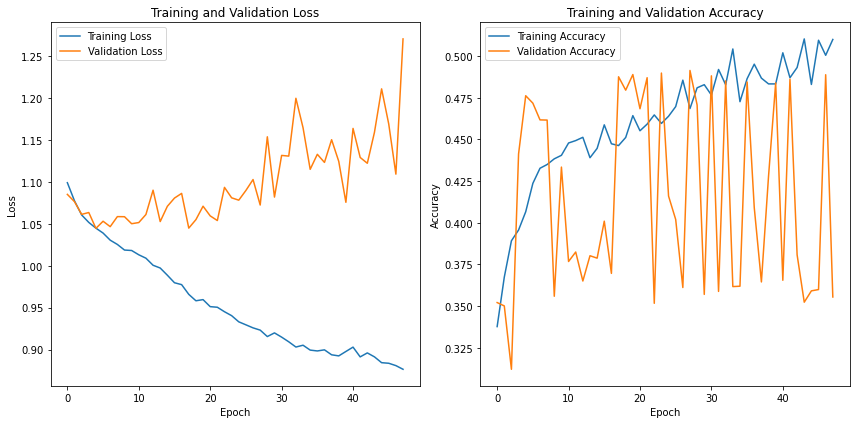

In [35]:
# Extrae la información de la historia
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_accuracy = history.history['categorical_accuracy']
val_accuracy = history.history['val_categorical_accuracy']

# Crea subgráficos para la pérdida y la precisión
plt.figure(figsize=(12, 6))

# Gráfico de pérdida
plt.subplot(1, 2, 1)
plt.plot(train_loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Gráfico de precisión
plt.subplot(1, 2, 2)
plt.plot(train_accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Ajusta el diseño de los subgráficos
plt.tight_layout()

# Muestra los gráficos
plt.show()

656


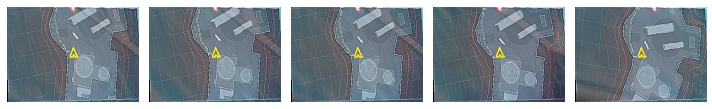

[1 0 0 0 0 0 0 0 0 0]


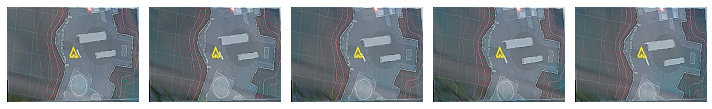

[0 0 1 0 0 0 0 0 0 0]


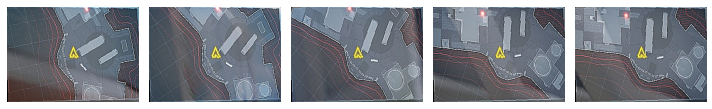

[1 0 0 0 0 0 0 0 0 0]


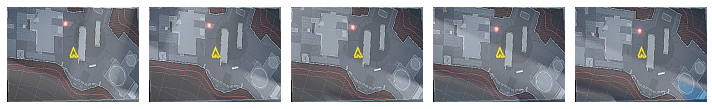

[0 0 0 1 0 0 0 0 0 0]


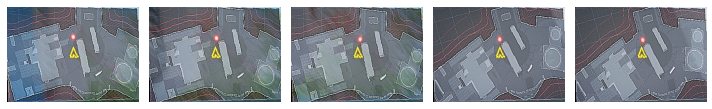

[0 0 1 0 0 0 0 0 0 0]


In [41]:
#Cantidad de batches en los que se divide el df
print(test_generator_Mapa.__len__())

#Comprobamos funcionamiento bach
X_batch, y_batch = test_generator_Mapa.__getitem__(2)

for i in range(0,batch_size):  # 4 es el maximo de conjunto de imagenes del batch creado
    # Seleccionamos ver la posicion numero 0 del batch creado
    comprobar_contenido(X_batch , y_batch,i)

In [36]:
resultado = model_acciones.evaluate(test_generator_Mapa)

328/328 ━━━━━━━━━━━━━━━━━━━━ 57s 174ms/step - categorical_accuracy: 0.4860 - loss: 1.0853


In [37]:
resultado

[1.0839451551437378, 0.4803173542022705]

## Ver como se comporta el modelo

In [38]:
from sklearn.metrics import f1_score,confusion_matrix

valores_originales = df_test_mapa[ETIQUETAS].copy()
valores_originales.reset_index(drop=True, inplace=True)

In [39]:
valores_originales

,label_0,label_1,label_2
0,0,1,0
1,0,1,0
2,0,0,1
3,0,1,0
4,0,0,1
...,...,...,...
3272,0,1,0
3273,0,0,1
3274,0,1,0
3275,1,0,0


In [40]:
valores_originales

,label_0,label_1,label_2
0,0,1,0
1,0,1,0
2,0,0,1
3,0,1,0
4,0,0,1
...,...,...,...
3272,0,1,0
3273,0,0,1
3274,0,1,0
3275,1,0,0


In [41]:
# Generar predicciones en el conjunto de prueba
predictions = model_acciones.predict(test_generator_Mapa)

328/328 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step


In [42]:
predictions

array([[0.33244985, 0.32748058, 0.3400696 ],
       [0.32485735, 0.3314077 , 0.34373492],
       [0.32781503, 0.32977256, 0.3424124 ],
       ...,
       [0.33732787, 0.08267528, 0.5799968 ],
       [0.8101524 , 0.01569902, 0.17414859],
       [0.28321466, 0.3373776 , 0.37940773]], dtype=float32)

In [43]:
# Convertir las probabilidades a etiquetas de clase
predicted_classes = np.argmax(predictions, axis=1)

#Convertimos las etiquetas one  hot a numeros
true_classes = np.argmax(valores_originales.values, axis=1)

In [44]:
predicted_classes[:20]

array([2, 2, 2, 2, 2, 1, 2, 1, 2, 2, 1, 1, 2, 2, 1, 2, 1, 2, 1, 1])

In [45]:
true_classes[:20]

array([1, 1, 2, 1, 2, 1, 2, 1, 2, 0, 2, 1, 2, 2, 1, 1, 2, 1, 2, 2])

In [46]:
# Calcular el F1 Score
f1 = f1_score(true_classes, predicted_classes, average='weighted')
print('F1 Score:', f1)

F1 Score: 0.4067565282219704


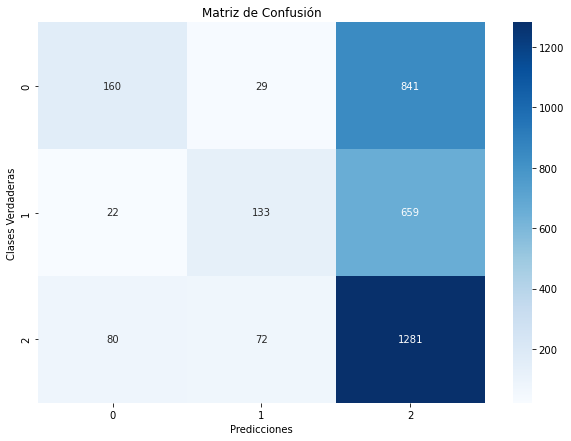

In [47]:
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Calcular la matriz de confusión
cm = confusion_matrix(true_classes, predicted_classes)

# Crear un gráfico de la matriz de confusión
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')

# Añadir etiquetas y título
plt.xlabel('Predicciones')
plt.ylabel('Clases Verdaderas')
plt.title('Matriz de Confusión')

# Mostrar el gráfico
plt.show()

## Resultatado Entrenamientos

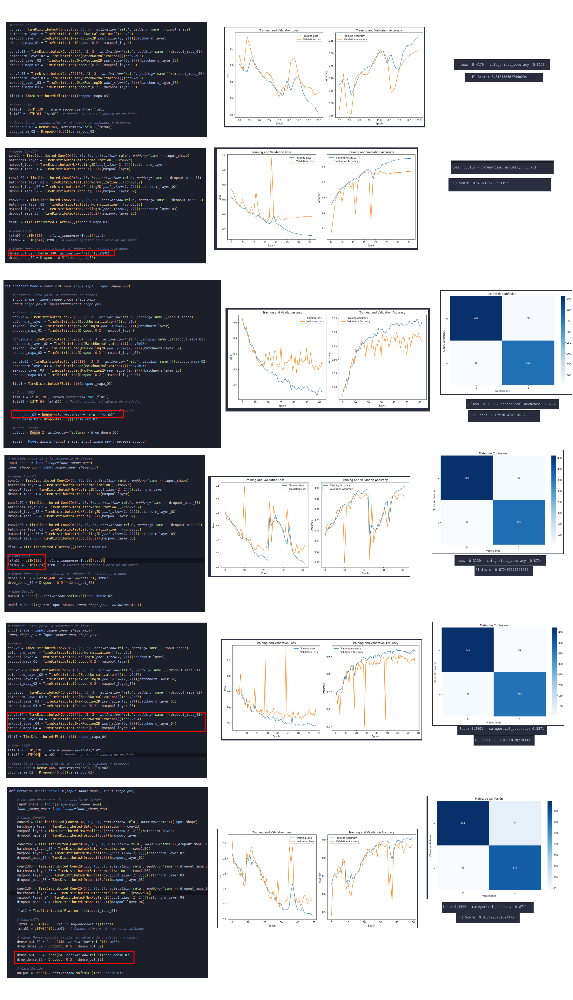

In [ ]:
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Ejemplo de uso:
gail = GAIL(model_generator, model_discriminator, generator_optimizer, discriminator_optimizer,pesos_train)

# Callbacks
early_stopping = EarlyStopping(monitor='val_categorical_accuracy', patience=40, verbose=1, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('modelo_gan_checkpoint.keras', monitor='val_categorical_accuracy', save_best_only=True, verbose=1)


# Asegura que el callback conoce el modelo sobre el cual actuar
model_checkpoint.set_model(model_generator)
early_stopping.set_model(model_generator)

# Asumiendo que tienes un bucle de entrenamiento
for epoch in range(1000):
    for batch_index in range(train_generator_Mapa.__len__()):
        X_batch, y_batch = train_generator_Mapa.__getitem__(batch_index)

        # Verificar que el lote no esté vacío
        if X_batch.shape[0] == 0 or y_batch.shape[0] == 0:
            print(f"Lote vacío en el índice de training: {batch_index}, saltando este batch.")
            continue

        generator_loss, discriminator_loss = gail.train_step(X_batch, y_batch)
        print(f"Epoch: {epoch}, Batch: {batch_index}, Generator Loss: {generator_loss.numpy()}, Discriminator Loss: {discriminator_loss.numpy()}")

    val_losses = []
    val_accuracies = []
    
    for batch_index_02 in range(valid_generator_Mapa.__len__()):
        X_batch_val, y_batch_val = valid_generator_Mapa.__getitem__(batch_index_02)
        
        # Verificar que el lote de validación no esté vacío
        if X_batch_val.shape[0] == 0 or y_batch_val.shape[0] == 0:
            print(f"Lote vacío en el índice de validación: {batch_index_02}, saltando este batch.")
            continue
        val_loss, val_accuracy = model_generator.evaluate(X_batch_val, y_batch_val, verbose=0)
        #print(f"Epoch: {epoch}, Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)
    
    avg_val_loss = np.mean(val_losses)
    avg_val_accuracy = np.mean(val_accuracies)
    
    model_checkpoint.on_epoch_end(epoch, {'val_categorical_accuracy': avg_val_accuracy})
    early_stopping.on_epoch_end(epoch, {'val_categorical_accuracy': avg_val_accuracy})
    if early_stopping.model.stop_training:
        print("Early stopping triggered. Training stopped.")
        break

    print(f"Epoch {epoch} - Avg Validation Loss: {avg_val_loss}, Avg Validation Accuracy: {avg_val_accuracy}")